# Military Power Clustering

Source : globalfirepower.com on 1st may 2020

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/world-military-power-2020/World military power.csv


# <p style="background-color:#9c2162;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">MILITARY POWER SEGMENTATION</p>

## "War does not determine who is right - only who is left." - Bertrand Russell

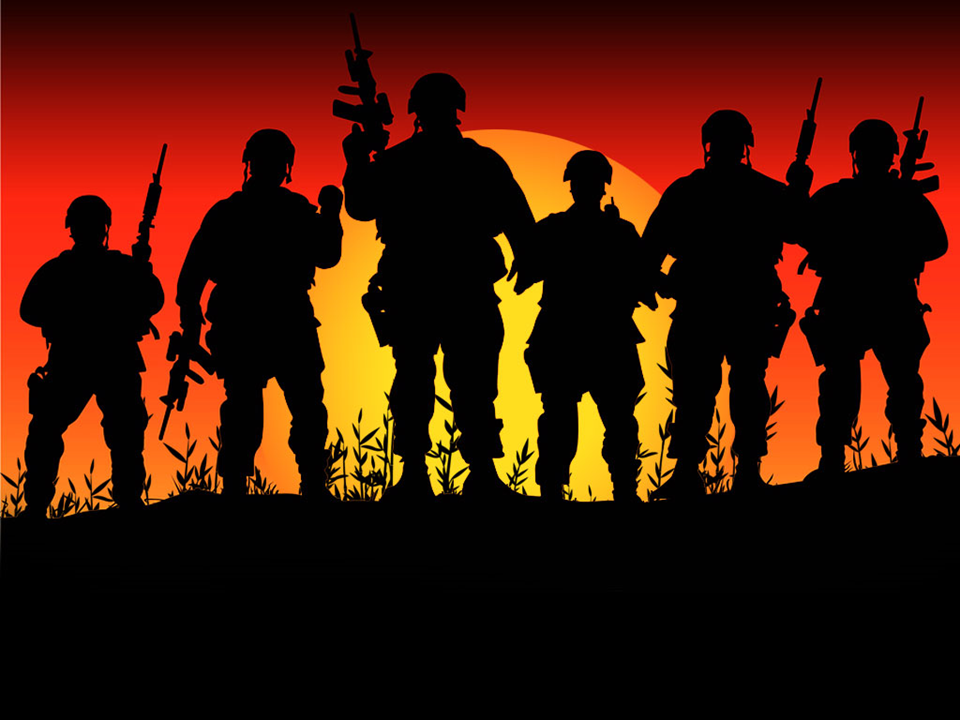

<p style="background-color:#9c2162;font-family:newtimeroman;color:#FFF9ED;font-size:140%;text-align:left;border-radius:10px 10px;">Image credit : https://www.slideteam.net/blog/top-25-army-military-powerpoint-templates-to-honor-our-heroes</p> 

<a id="toc"></a>

## <h3 style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;" class="list-group-item list-group-item-action active" data-toggle="list" role="tablist" aria-controls="home">TABLE OF CONTENTS</h3>

* [   PREFACE](#0)
* [1) LIBRARIES NEEDED IN THE STUDY](#1)
    * [1.1 User Defined Functions](#1.1)
* [2) DATA](#2)
    * [2.1 Context](#2.1)
    * [2.2 About the Features](#2.2) 
    * [2.3 What the Problem is](#2.3) 
* [3) ANALYSIS](#3)
    * [3.1) Reading the Data](#3)
* [4) EXPLORATORY DATA ANALYSIS (EDA) & VISUALIZATION](#4)
    * [4.1 - A General Looking at the Data](#4.1)
    * [4.2 - Convert Multi-Index Columns To One Level](#4.2)
    * [4.3 - Handling with Missing Values](#4.3)
    * [4.4 - Handling with Data Types](#4.4)
    * [4.5 - The Selection of Features](#4.5)
    * [4.6 - The Visualization of Some Features](#4.6) 
    * [4.7 - Descriptive Statistics](#4.7) 
* [5) DATA PREPROCESSING](#5)     
    * [5.1 The Implementation of Scaling](#5.1)
* [6) MODELLING WITH K-MEANS](#6)        
    * [6.1 Hopkins Test](#6.1)
    * [6.2 The Implementation of K-Means](#6.2)
        * [6.2.1 Finding The Best K Value With Elbow Method](#6.2.1)
        * [6.2.2 The Implementation of K-Means With Optimal K Value & Visualization](#6.2.2)
        * [6.2.3 The Assesment of Silhouette Scores](#6.2.3)
* [7) MODELLING WITH HIERARCHICAL CLUSTER ANALYSIS (HCA)](#7)  
    * [7.1 The Assesment of Dentrogram](#7.1)
    * [7.2 The Assesment of Silhouette Scores For Hierarchical Cluster Analysis (HCA)](#7.2)   
    * [7.3 The Implementation of Hierarchical Cluster Analysis (HCA)](#7.3)
* [8) THE VISUAL COMPARISON & EVALUATION OF MODELS](#8) 
* [9) CONLUSION](#9)
* [10) REFERENCES](#10)
* [11) FURTHER READINGS](#11)

<a id="0"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">PREFACE</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**In this Exploratory Data Analysis (EDA) and a variety of Unsupervised Clustering algorithms including including K-Means and Hierarchical Cluster Analysis (HCA), this study will examine the dataset named as "world military power 2020" under the 'World military power.csv' file at Kaggle website [external link text](https://www.kaggle.com/mingookkim/world-military-power-2020).**

**This study, in general, will cover what any beginner in Machine Learning can do as much as possible for a better understanding with the given dataset not only by examining its various aspects but also visualising it. Later S/he will be familiar with Unsupervised Clustering algorithms including including K-Means and Hierarchical Cluster Analysis (HCA) in Machine Learning.**

<a id="1"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">1 - LIBRARIES NEEDED IN THE STUDY</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**First, let's begin importing libraries needed in the given analysis**

In [2]:
# If you need pyclustertend, run this cell by uncommenting it

!pip install pyclustertend

In [3]:
# !pip install pyforest
# !pip install ipython
# !pip install pyclustertend

# 1-Import Libraies
import numpy as np
import pandas as pd 
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import scipy.stats as stats
%matplotlib inline
import statsmodels.api as sm
import statsmodels.formula.api as smf

from sklearn.compose import make_column_transformer
from sklearn.cluster import KMeans
from pyclustertend import hopkins
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

# 2-Scaling
from sklearn.preprocessing import scale 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PowerTransformer 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler


# 3-Importing plotly and cufflinks in offline mode
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

# 4-Ignore Warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.warn("this will not show")

# 5-Figure&Display options
plt.rcParams["figure.figsize"] = (10, 6)
pd.set_option('max_colwidth',200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

#!pip install termcolor
from termcolor import colored
import missingno as msno 

# !pip3 install termcolor
import colorama
from colorama import Fore, Style  # maakes strings colored
from termcolor import colored

<a id="1.1"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">1.1 User Defined Functions</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**We have defined some useful user defined functions**

In [4]:
###############################################################################

def missing(df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

def missing_values(df):
    return missing(df)[missing(df)['Missing_Number']>0]

###############################################################################

def first_looking(df):
    print(colored("Shape:", attrs=['bold']), df.shape,'\n',
          f"There is ", df.shape[0], " observation and ", df.shape[1], " columns in the dataset.", '\n',
          colored('-'*79, 'red', attrs=['bold']),
          colored("\nInfo:\n", attrs=['bold']), sep='')
    print(df.info(), '\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("Number of Uniques:\n", attrs=['bold']), df.nunique(),'\n',
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("Missing Values:\n", attrs=['bold']), missing_values(df),'\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("All Columns:", attrs=['bold']), list(df.columns),'\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')

    df.columns= df.columns.str.lower().str.replace('&', '_').str.replace(' ', '_')

    print(colored("Columns after rename:", attrs=['bold']), list(df.columns),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')

def duplicate_values(df):
    duplicate_values = df.duplicated(subset=None, keep='first').sum()
    if duplicate_values > 0:
        df.drop_duplicates(keep='first', inplace=True)
        print(duplicate_values, colored("duplicates were dropped", attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
    else:
        print(colored("No duplicates", attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
        
def drop_columns(df, drop_columns):
    if drop_columns !=[]:
        df.drop(drop_columns, axis=1, inplace=True)
        print(drop_columns, 'were dropped')
    else:
        print(colored('We will now check the missing values and if necessary drop some columns!!!', attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
        
def drop_null(df, limit):
    print('Shape:', df.shape)
    for i in df.isnull().sum().index:
        if (df.isnull().sum()[i]/df.shape[0]*100)>limit:
            print(df.isnull().sum()[i], 'percent of', i ,'null and were dropped')
            df.drop(i, axis=1, inplace=True)
            print('new shape:', df.shape)
        else:
            print(df.isnull().sum()[i], '%, percentage of missing values of', i ,'less than limit', limit, '%, so we will keep it.')
    print('New shape after missing value control:', df.shape)

###############################################################################

In [5]:
# Function for determining the number and percentages of missing values

def missing (df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

In [6]:
# To view summary information about the column

def first_look(col):
    print("column name    : ", col)
    print("--------------------------------")
    print("per_of_nulls   : ", "%", round(df[col].isnull().sum()/df.shape[0]*100, 2))
    print("num_of_nulls   : ", df[col].isnull().sum())
    print("num_of_uniques : ", df[col].nunique())
    print(df[col].value_counts(dropna = False))

<a id="2"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">2 - DATA</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**This is a data that allows you to see the world military rankings in 2020 and numerical status such as the army, navy, and air force. In addition, some features such as population and economy related to military power are included as well.**

**For a better understanding and more information, please refer to [external link text](https://data.world/vizzup/world-military-power/workspace/file?filename=World+military+power.xlsx)**

<a id="2.1"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:left; border-radius:10px 10px;">2.1 Context</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**The security of any country depends on the strength of its Army, Navy and the Air Force. That's why a considerable amount of money is budgeted to them. Countries around the world are spending billions to increase external forces, avoid external attacks and protect their respective nations.**

**The Global Firepower utilizes over 50 individual factors to determine a given nation’s Power Index (PwrIndx) score with categories ranging from military might and financials to logistical capability and geography.**

<a id="2.2"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:left; border-radius:10px 10px;">2.2 About The Features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**The features in the given dataset are:**

- 'Military Strength', 
- 'Military Strength Power Index',
- 'Aircraft Strength', 
- 'Aircraft Strength value',
- 'Fighter/Interceptor Strength', 
- 'Fighter/Interceptor Strength value',
- 'Attack Aircraft Strength', 
- 'Attack Aircraft Strength value',
- 'Transport Aircraft Fleet Strength',
- 'Transport Aircraft Fleet Strength value', 
- 'Trainer Aircraft Fleet',
- 'Trainer Aircraft Fleet value', 
- 'Helicopter Fleet Strength',
- 'Helicopter Fleet Strength value', 
- 'Attack Helicopter Fleet Strength',
- 'Attack Helicopter Fleet Strength value', 
- 'Tank Strength',
- 'Tank Strength value', 
- 'AFV/APC Strength', 
- 'AFV/APC Strength value',
- 'Self-Propelled Artillery Strength',
- 'Self-Propelled Artillery Strength value', 
- 'Towed Artillery Strength',
- 'Towed Artillery Strength value', 
- 'Rocket Projector Strength',
- 'Rocket Projector Strength value', 
- 'Navy Fleet Strengths',
- 'Navy Fleet Strengths value', 
- 'Aircraft Carrier Fleet Strength',
- 'Aircraft Carrier Fleet Strength value', 
- 'Submarine Fleet Strength',
- 'Submarine Fleet Strength value', 
- 'Destroyer Fleet Strength',
- 'Destroyer Fleet Strength value', 
- 'Frigate Fleet Strength',
- 'Frigate Fleet Strength value', 
- 'defense spending budget',
- 'defense spending budget value', 
- 'External Debt', 'External Debt value',
- 'Airport Totals', 
- 'Airport Totals value', 
- 'Oil Production',
- 'Oil Production value', 
- 'Oil Consumption', 
- 'Oil Consumption value',
- 'Proven Oil Reserves', 
- 'Proven Oil Reserves value',
- 'Available Manpower', 
- 'Available Manpower value', 
- 'Total Population',
- 'Total Population value', 
- 'Total Square Land Area',
- 'Total Square Land Area value', 
- 'Total Coastline Coverage',
- 'Total Coastline Coverage value', 
- 'Total Waterway Coverage',
- 'Total Waterway Coverage value', 
- 'Total Border Coverage',
- 'Total Border Coverage value'

<a id="2.3"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:left; border-radius:10px 10px;">2.3 What The Problem Is</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**- In the given study, we have a clustering problem.**

- We will try to find the clusters in the given dataset.

- Lastly we will build a variety of Unsupervised algorithms including K-Means and Hierarchical Cluster Analysis (HCA).

<a id="3"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">3 - ANALYSIS</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

<a id="3.1"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">3.1 Reading The Data</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**How to read and assign the dataset as df. [external link text](https://pandas.pydata.org/docs/reference/api/pandas.read_csv.html) (You can define it as what you want instead of df)**

In [7]:
df0 = pd.read_csv("../input/world-military-power-2020/World military power.csv", header=1)
df = df0.copy()

In [8]:
df.head()

,Military Strength,Military Strength Power Index,Aircraft Strength,Aircraft Strength value,Fighter/Interceptor Strength,Fighter/Interceptor Strength value,Attack Aircraft Strength,Attack Aircraft Strength value,Transport Aircraft Fleet Strength,Transport Aircraft Fleet Strength value,Trainer Aircraft Fleet,Trainer Aircraft Fleet value,Helicopter Fleet Strength,Helicopter Fleet Strength value,Attack Helicopter Fleet Strength,Attack Helicopter Fleet Strength value,Tank Strength,Tank Strength value,AFV/APC Strength,AFV/APC Strength value,Self-Propelled Artillery Strength,Self-Propelled Artillery Strength value,Towed Artillery Strength,Towed Artillery Strength value,Rocket Projector Strength,Rocket Projector Strength value,Navy Fleet Strengths,Navy Fleet Strengths value,Aircraft Carrier Fleet Strength,Aircraft Carrier Fleet Strength value,Submarine Fleet Strength,Submarine Fleet Strength value,Destroyer Fleet Strength,Destroyer Fleet Strength value,Frigate Fleet Strength,Frigate Fleet Strength value,defense spending budget,defense spending budget value,External Debt,External Debt value,Airport Totals,Airport Totals value,Oil Production,Oil Production value,Oil Consumption,Oil Consumption value,Proven Oil Reserves,Proven Oil Reserves value,Available Manpower,Available Manpower value,Total Population,Total Population value,Total Square Land Area,Total Square Land Area value,Total Coastline Coverage,Total Coastline Coverage value,Total Waterway Coverage,Total Waterway Coverage value,Total Border Coverage,Total Border Coverage value
0,Afghanistan,1.344,Afghanistan,260,Afghanistan,0,Afghanistan,25.000,Afghanistan,30.000,Afghanistan,0,Afghanistan,187,Afghanistan,0.000,Afghanistan,0,Afghanistan,"1,062",Afghanistan,0,Afghanistan,176,Afghanistan,50,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,"12,00,00,00,000",Afghanistan,"2,84,00,00,000",Afghanistan,43,Afghanistan,0,Afghanistan,"5,500",Afghanistan,0,Afghanistan,"1,43,25,743",Afghanistan,"3,49,40,837",Afghanistan,"6,52,230",Afghanistan,0,Afghanistan,"1,200",Afghanistan,"5,987"
1,Albania,2.314,Albania,19,Albania,0,Albania,0.000,Albania,0.000,Albania,0,Albania,19,Albania,0.000,Albania,0,Albania,467,Albania,0,Albania,0,Albania,0,Albania,38.000,Albania,0.000,Albania,0.000,Albania,0.000,Albania,0.000,Albania,"25,00,00,000",Albania,"9,50,50,00,000",Albania,4,Albania,"16,000",Albania,"42,500",Albania,"16,83,00,000",Albania,"15,19,438",Albania,"30,57,220",Albania,"28,748",Albania,362,Albania,41,Albania,691
2,Algeria,0.466,Algeria,551,Algeria,103,Algeria,22.000,Algeria,59.000,Algeria,87,Algeria,257,Algeria,45.000,Algeria,880,Algeria,"7,361",Algeria,320,Algeria,240,Algeria,316,Algeria,201.000,Algeria,0.000,Algeria,6.000,Algeria,0.000,Algeria,5.000,Algeria,"13,00,00,00,000",Algeria,"6,26,00,00,000",Algeria,157,Algeria,"13,06,000",Algeria,"3,25,000",Algeria,"12,20,00,00,000",Algeria,"2,07,41,263",Algeria,"4,16,57,488",Algeria,"23,81,741",Algeria,998,Algeria,0,Algeria,"6,734"
3,Angola,0.838,Angola,295,Angola,72,Angola,18.000,Angola,30.000,Angola,47,Angola,126,Angola,15.000,Angola,379,Angola,595,Angola,28,Angola,357,Angola,115,Angola,57.000,Angola,0.000,Angola,0.000,Angola,0.000,Angola,0.000,Angola,"7,00,00,00,000",Angola,"42,08,00,00,000",Angola,176,Angola,"16,66,000",Angola,"82,300",Angola,"8,27,30,00,000",Angola,"62,44,205",Angola,"3,03,55,880",Angola,"12,46,700",Angola,"1,600",Angola,"1,300",Angola,"5,369"
4,Argentina,0.652,Argentina,227,Argentina,24,Argentina,7.000,Argentina,9.000,Argentina,64,Argentina,100,Argentina,0.000,Argentina,370,Argentina,739,Argentina,83,Argentina,172,Argentina,26,Argentina,49.000,Argentina,0.000,Argentina,2.000,Argentina,4.000,Argentina,0.000,Argentina,"4,20,00,00,000",Argentina,"2,14,90,00,00,000",Argentina,"1,138",Argentina,"4,79,400",Argentina,"6,85,000",Argentina,"2,18,50,00,000",Argentina,"2,01,79,430",Argentina,"4,46,94,198",Argentina,"27,80,400",Argentina,"4,989",Argentina,"11,000",Argentina,"11,968"


<a id="4"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">4 - EXPLORATORY DATA ANALYSIS (EDA) & VISUALIZATION</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>


**Before performing Unsupervised Clustering algorithms including including K-Means and Hierarchical Cluster Analysis (HCA), you need to know the data well in order to label the observations correctly. You need to analyze frequency distributions of features, relationships and correlations between the independent variables and the dependent variable. It is recommended to apply data visualization techniques. Observing breakpoints helps you to internalize the data.**

**So, in this Exploratory Data Analysis section the data will be analyzed by summarizing its main characteristics, using statistical graphics and other data visualization methods. As such the reader will be familiar with what the data can tell.**

**You can use first_looking(df) user defined function above for getting a general insight before going further in the analysis**

In [9]:
first_looking(df)

Shape:(165, 60)
There is 165 observation and 60 columns in the dataset.
-------------------------------------------------------------------------------
Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165 entries, 0 to 164
Data columns (total 60 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Military Strength                        138 non-null    object 
 1   Military Strength Power Index            138 non-null    float64
 2   Aircraft Strength                        138 non-null    object 
 3   Aircraft Strength value                  138 non-null    object 
 4   Fighter/Interceptor Strength             138 non-null    object 
 5   Fighter/Interceptor Strength value       138 non-null    object 
 6   Attack Aircraft Strength                 138 non-null    object 
 7   Attack Aircraft Strength value           138 non-null    float64
 8   Transport Aircraft Fleet Streng

<a id="4.1"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.1 A General Looking at the Data</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [10]:
df.head(3)

,military_strength,military_strength_power_index,aircraft_strength,aircraft_strength_value,fighter/interceptor_strength,fighter/interceptor_strength_value,attack_aircraft_strength,attack_aircraft_strength_value,transport_aircraft_fleet_strength,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet,trainer_aircraft_fleet_value,helicopter_fleet_strength,helicopter_fleet_strength_value,attack_helicopter_fleet_strength,attack_helicopter_fleet_strength_value,tank_strength,tank_strength_value,afv/apc_strength,afv/apc_strength_value,self-propelled_artillery_strength,self-propelled_artillery_strength_value,towed_artillery_strength,towed_artillery_strength_value,rocket_projector_strength,rocket_projector_strength_value,navy_fleet_strengths,navy_fleet_strengths_value,aircraft_carrier_fleet_strength,aircraft_carrier_fleet_strength_value,submarine_fleet_strength,submarine_fleet_strength_value,destroyer_fleet_strength,destroyer_fleet_strength_value,frigate_fleet_strength,frigate_fleet_strength_value,defense_spending_budget,defense_spending_budget_value,external_debt,external_debt_value,airport_totals,airport_totals_value,oil_production,oil_production_value,oil_consumption,oil_consumption_value,proven_oil_reserves,proven_oil_reserves_value,available_manpower,available_manpower_value,total_population,total_population_value,total_square_land_area,total_square_land_area_value,total_coastline_coverage,total_coastline_coverage_value,total_waterway_coverage,total_waterway_coverage_value,total_border_coverage,total_border_coverage_value
0,Afghanistan,1.344,Afghanistan,260,Afghanistan,0,Afghanistan,25.000,Afghanistan,30.000,Afghanistan,0,Afghanistan,187,Afghanistan,0.000,Afghanistan,0,Afghanistan,"1,062",Afghanistan,0,Afghanistan,176,Afghanistan,50,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,"12,00,00,00,000",Afghanistan,"2,84,00,00,000",Afghanistan,43,Afghanistan,0,Afghanistan,"5,500",Afghanistan,0,Afghanistan,"1,43,25,743",Afghanistan,"3,49,40,837",Afghanistan,"6,52,230",Afghanistan,0,Afghanistan,"1,200",Afghanistan,"5,987"
1,Albania,2.314,Albania,19,Albania,0,Albania,0.000,Albania,0.000,Albania,0,Albania,19,Albania,0.000,Albania,0,Albania,467,Albania,0,Albania,0,Albania,0,Albania,38.000,Albania,0.000,Albania,0.000,Albania,0.000,Albania,0.000,Albania,"25,00,00,000",Albania,"9,50,50,00,000",Albania,4,Albania,"16,000",Albania,"42,500",Albania,"16,83,00,000",Albania,"15,19,438",Albania,"30,57,220",Albania,"28,748",Albania,362,Albania,41,Albania,691
2,Algeria,0.466,Algeria,551,Algeria,103,Algeria,22.000,Algeria,59.000,Algeria,87,Algeria,257,Algeria,45.000,Algeria,880,Algeria,"7,361",Algeria,320,Algeria,240,Algeria,316,Algeria,201.000,Algeria,0.000,Algeria,6.000,Algeria,0.000,Algeria,5.000,Algeria,"13,00,00,00,000",Algeria,"6,26,00,00,000",Algeria,157,Algeria,"13,06,000",Algeria,"3,25,000",Algeria,"12,20,00,00,000",Algeria,"2,07,41,263",Algeria,"4,16,57,488",Algeria,"23,81,741",Algeria,998,Algeria,0,Algeria,"6,734"


In [11]:
df.tail(3)

,military_strength,military_strength_power_index,aircraft_strength,aircraft_strength_value,fighter/interceptor_strength,fighter/interceptor_strength_value,attack_aircraft_strength,attack_aircraft_strength_value,transport_aircraft_fleet_strength,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet,trainer_aircraft_fleet_value,helicopter_fleet_strength,helicopter_fleet_strength_value,attack_helicopter_fleet_strength,attack_helicopter_fleet_strength_value,tank_strength,tank_strength_value,afv/apc_strength,afv/apc_strength_value,self-propelled_artillery_strength,self-propelled_artillery_strength_value,towed_artillery_strength,towed_artillery_strength_value,rocket_projector_strength,rocket_projector_strength_value,navy_fleet_strengths,navy_fleet_strengths_value,aircraft_carrier_fleet_strength,aircraft_carrier_fleet_strength_value,submarine_fleet_strength,submarine_fleet_strength_value,destroyer_fleet_strength,destroyer_fleet_strength_value,frigate_fleet_strength,frigate_fleet_strength_value,defense_spending_budget,defense_spending_budget_value,external_debt,external_debt_value,airport_totals,airport_totals_value,oil_production,oil_production_value,oil_consumption,oil_consumption_value,proven_oil_reserves,proven_oil_reserves_value,available_manpower,available_manpower_value,total_population,total_population_value,total_square_land_area,total_square_land_area_value,total_coastline_coverage,total_coastline_coverage_value,total_waterway_coverage,total_waterway_coverage_value,total_border_coverage,total_border_coverage_value
162,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
163,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
164,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
df.sample(10)

,military_strength,military_strength_power_index,aircraft_strength,aircraft_strength_value,fighter/interceptor_strength,fighter/interceptor_strength_value,attack_aircraft_strength,attack_aircraft_strength_value,transport_aircraft_fleet_strength,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet,trainer_aircraft_fleet_value,helicopter_fleet_strength,helicopter_fleet_strength_value,attack_helicopter_fleet_strength,attack_helicopter_fleet_strength_value,tank_strength,tank_strength_value,afv/apc_strength,afv/apc_strength_value,self-propelled_artillery_strength,self-propelled_artillery_strength_value,towed_artillery_strength,towed_artillery_strength_value,rocket_projector_strength,rocket_projector_strength_value,navy_fleet_strengths,navy_fleet_strengths_value,aircraft_carrier_fleet_strength,aircraft_carrier_fleet_strength_value,submarine_fleet_strength,submarine_fleet_strength_value,destroyer_fleet_strength,destroyer_fleet_strength_value,frigate_fleet_strength,frigate_fleet_strength_value,defense_spending_budget,defense_spending_budget_value,external_debt,external_debt_value,airport_totals,airport_totals_value,oil_production,oil_production_value,oil_consumption,oil_consumption_value,proven_oil_reserves,proven_oil_reserves_value,available_manpower,available_manpower_value,total_population,total_population_value,total_square_land_area,total_square_land_area_value,total_coastline_coverage,total_coastline_coverage_value,total_waterway_coverage,total_waterway_coverage_value,total_border_coverage,total_border_coverage_value
78,Mozambique,2.336,Mozambique,16,Mozambique,8,Mozambique,0.000,Mozambique,1.000,Mozambique,1,Mozambique,6,Mozambique,2.000,Mozambique,100,Mozambique,335,Mozambique,0,Mozambique,260,Mozambique,12,Mozambique,8.000,Mozambique,0.000,Mozambique,0.000,Mozambique,0.000,Mozambique,0.000,Mozambique,"24,50,00,000",Mozambique,"10,91,00,00,000",Mozambique,98,Mozambique,0,Mozambique,"22,500",Mozambique,0,Mozambique,"46,29,744",Mozambique,"2,72,33,789",Mozambique,"7,99,380",Mozambique,"2,470",Mozambique,460,Mozambique,"4,783"
46,Guatemala,1.830,Guatemala,33,Guatemala,0,Guatemala,4.000,Guatemala,8.000,Guatemala,6,Guatemala,15,Guatemala,0.000,Guatemala,12,Guatemala,135,Guatemala,0,Guatemala,106,Guatemala,0,Guatemala,26.000,Guatemala,0.000,Guatemala,0.000,Guatemala,0.000,Guatemala,0.000,Guatemala,"24,00,00,000",Guatemala,"22,92,00,00,000",Guatemala,291,Guatemala,"9,666",Guatemala,"85,000",Guatemala,"8,30,70,000",Guatemala,"70,63,622",Guatemala,"1,65,81,273",Guatemala,"1,08,889",Guatemala,400,Guatemala,990,Guatemala,"1,667"
61,Kuwait,1.570,Kuwait,85,Kuwait,27,Kuwait,0.000,Kuwait,2.000,Kuwait,13,Kuwait,40,Kuwait,16.000,Kuwait,367,Kuwait,745,Kuwait,98,Kuwait,0,Kuwait,27,Kuwait,38.000,Kuwait,0.000,Kuwait,0.000,Kuwait,0.000,Kuwait,0.000,Kuwait,"6,83,10,00,000",Kuwait,"47,24,00,00,000",Kuwait,7,Kuwait,"27,53,000",Kuwait,"3,45,000",Kuwait,"1,01,50,00,00,000",Kuwait,"16,41,971",Kuwait,"29,16,467",Kuwait,"17,818",Kuwait,499,Kuwait,0,Kuwait,475
9,Bahrain,1.855,Bahrain,109,Bahrain,17,Bahrain,0.000,Bahrain,2.000,Bahrain,37,Bahrain,65,Bahrain,22.000,Bahrain,180,Bahrain,843,Bahrain,33,Bahrain,26,Bahrain,17,Bahrain,39.000,Bahrain,0.000,Bahrain,0.000,Bahrain,0.000,Bahrain,1.000,Bahrain,"1,41,50,00,000",Bahrain,"52,15,00,00,000",Bahrain,4,Bahrain,"45,000",Bahrain,"55,000",Bahrain,"12,46,00,000",Bahrain,"8,06,505",Bahrain,"14,22,659",Bahrain,760,Bahrain,161,Bahrain,0,NaN,NaN
19,Burkina Faso,1.901,Burkina Faso,16,Burkina Faso,0,Burkina Faso,3.000,Burkina Faso,1.000,Burkina Faso,4,Burkina Faso,8,Burkina Faso,2.000,Burkina Faso,0,Burkina Faso,350,Burkina Faso,0,Burkina Faso,0,Burkina Faso,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Burkina Faso,"13,00,00,000",Burkina Faso,"3,05,60,00,000",Burkina Faso,23,Burkina Faso,0,Burkina Faso,"10,500",Burkina Faso,0,Burkina Faso,"78,00,000",Burkina Faso,"1,97,42,715",Burkina Faso,"2,74,200",NaN,NaN,Burkina Faso,0,Burkina Faso,"3,611"
94,Peru,0.622,Peru,273,Peru,17,Peru,38.000,Peru,40.000,Peru,77,Peru,99,P

In [13]:
df.columns

Index(['military_strength', 'military_strength_power_index',
       'aircraft_strength', 'aircraft_strength_value',
       'fighter/interceptor_strength', 'fighter/interceptor_strength_value',
       'attack_aircraft_strength', 'attack_aircraft_strength_value',
       'transport_aircraft_fleet_strength',
       'transport_aircraft_fleet_strength_value', 'trainer_aircraft_fleet',
       'trainer_aircraft_fleet_value', 'helicopter_fleet_strength',
       'helicopter_fleet_strength_value', 'attack_helicopter_fleet_strength',
       'attack_helicopter_fleet_strength_value', 'tank_strength',
       'tank_strength_value', 'afv/apc_strength', 'afv/apc_strength_value',
       'self-propelled_artillery_strength',
       'self-propelled_artillery_strength_value', 'towed_artillery_strength',
       'towed_artillery_strength_value', 'rocket_projector_strength',
       'rocket_projector_strength_value', 'navy_fleet_strengths',
       'navy_fleet_strengths_value', 'aircraft_carrier_fleet_strength',


**You can rename columns to a more usable form, if you need.**

In [14]:
df.columns = df.columns.str.lower().str.replace('&', '_').str.replace(' ', '_')

In [15]:
df.columns

Index(['military_strength', 'military_strength_power_index',
       'aircraft_strength', 'aircraft_strength_value',
       'fighter/interceptor_strength', 'fighter/interceptor_strength_value',
       'attack_aircraft_strength', 'attack_aircraft_strength_value',
       'transport_aircraft_fleet_strength',
       'transport_aircraft_fleet_strength_value', 'trainer_aircraft_fleet',
       'trainer_aircraft_fleet_value', 'helicopter_fleet_strength',
       'helicopter_fleet_strength_value', 'attack_helicopter_fleet_strength',
       'attack_helicopter_fleet_strength_value', 'tank_strength',
       'tank_strength_value', 'afv/apc_strength', 'afv/apc_strength_value',
       'self-propelled_artillery_strength',
       'self-propelled_artillery_strength_value', 'towed_artillery_strength',
       'towed_artillery_strength_value', 'rocket_projector_strength',
       'rocket_projector_strength_value', 'navy_fleet_strengths',
       'navy_fleet_strengths_value', 'aircraft_carrier_fleet_strength',


In [16]:
print("There is", df.shape[0], "observation and", df.shape[1], "columns in the dataset")

There is 165 observation and 60 columns in the dataset


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165 entries, 0 to 164
Data columns (total 60 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   military_strength                        138 non-null    object 
 1   military_strength_power_index            138 non-null    float64
 2   aircraft_strength                        138 non-null    object 
 3   aircraft_strength_value                  138 non-null    object 
 4   fighter/interceptor_strength             138 non-null    object 
 5   fighter/interceptor_strength_value       138 non-null    object 
 6   attack_aircraft_strength                 138 non-null    object 
 7   attack_aircraft_strength_value           138 non-null    float64
 8   transport_aircraft_fleet_strength        138 non-null    object 
 9   transport_aircraft_fleet_strength_value  138 non-null    float64
 10  trainer_aircraft_fleet                   138 non-n

In [18]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
military_strength_power_index,138.000,1.461,1.324,0.061,0.575,1.034,2.022,10.168
attack_aircraft_strength_value,138.000,25.761,94.528,0.000,0.000,0.000,15.750,742.000
transport_aircraft_fleet_strength_value,138.000,30.232,92.330,0.000,3.000,9.000,26.000,945.000
attack_helicopter_fleet_strength_value,138.000,25.623,97.326,0.000,0.000,2.000,17.750,967.000
navy_fleet_strengths_value,124.000,84.984,146.114,0.000,10.000,38.000,77.750,984.000
aircraft_carrier_fleet_strength_value,115.000,0.383,1.972,0.000,0.000,0.000,0.000,20.000
submarine_fleet_strength_value,115.000,4.800,13.707,0.000,0.000,0.000,4.000,83.000
destroyer_fleet_strength_value,115.000,2.052,10.001,0.000,0.000,0.000,0.000,91.000
frigate_fleet_strength_value,115.000,3.522,6.481,0.000,0.000,0.000,5.500,52.000


In [19]:
df.describe(include=object).T

,count,unique,top,freq
military_strength,138,138,Afghanistan,1
aircraft_strength,138,138,Afghanistan,1
aircraft_strength_value,138,113,19,5
fighter/interceptor_strength,138,138,Afghanistan,1
fighter/interceptor_strength_value,138,63,0,46
attack_aircraft_strength,138,138,Afghanistan,1
transport_aircraft_fleet_strength,138,138,Afghanistan,1
trainer_aircraft_fleet,138,138,Afghanistan,1
trainer_aircraft_fleet_value,138,77,0,25
helicopter_fleet_strength,138,138,Afghanistan,1


In [20]:
df.nunique()

military_strength                          138
military_strength_power_index              138
aircraft_strength                          138
aircraft_strength_value                    113
fighter/interceptor_strength               138
fighter/interceptor_strength_value          63
attack_aircraft_strength                   138
attack_aircraft_strength_value              38
transport_aircraft_fleet_strength          138
transport_aircraft_fleet_strength_value     49
trainer_aircraft_fleet                     138
trainer_aircraft_fleet_value                77
helicopter_fleet_strength                  138
helicopter_fleet_strength_value             97
attack_helicopter_fleet_strength           138
attack_helicopter_fleet_strength_value      45
tank_strength                              138
tank_strength_value                        106
afv/apc_strength                           138
afv/apc_strength_value                     130
self-propelled_artillery_strength          138
self-propelle

In [21]:
# to find how many unique values object features have

for col in df.select_dtypes(include=[np.number]).columns:
  print(f"{col} has {df[col].nunique()} unique value")

military_strength_power_index has 138 unique value
attack_aircraft_strength_value has 38 unique value
transport_aircraft_fleet_strength_value has 49 unique value
attack_helicopter_fleet_strength_value has 45 unique value
navy_fleet_strengths_value has 78 unique value
aircraft_carrier_fleet_strength_value has 5 unique value
submarine_fleet_strength_value has 20 unique value
destroyer_fleet_strength_value has 11 unique value
frigate_fleet_strength_value has 18 unique value


In [22]:
df.duplicated().value_counts()

False    139
True      26
dtype: int64

In [23]:
duplicate = df[df.duplicated()]

In [24]:
duplicate

,military_strength,military_strength_power_index,aircraft_strength,aircraft_strength_value,fighter/interceptor_strength,fighter/interceptor_strength_value,attack_aircraft_strength,attack_aircraft_strength_value,transport_aircraft_fleet_strength,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet,trainer_aircraft_fleet_value,helicopter_fleet_strength,helicopter_fleet_strength_value,attack_helicopter_fleet_strength,attack_helicopter_fleet_strength_value,tank_strength,tank_strength_value,afv/apc_strength,afv/apc_strength_value,self-propelled_artillery_strength,self-propelled_artillery_strength_value,towed_artillery_strength,towed_artillery_strength_value,rocket_projector_strength,rocket_projector_strength_value,navy_fleet_strengths,navy_fleet_strengths_value,aircraft_carrier_fleet_strength,aircraft_carrier_fleet_strength_value,submarine_fleet_strength,submarine_fleet_strength_value,destroyer_fleet_strength,destroyer_fleet_strength_value,frigate_fleet_strength,frigate_fleet_strength_value,defense_spending_budget,defense_spending_budget_value,external_debt,external_debt_value,airport_totals,airport_totals_value,oil_production,oil_production_value,oil_consumption,oil_consumption_value,proven_oil_reserves,proven_oil_reserves_value,available_manpower,available_manpower_value,total_population,total_population_value,total_square_land_area,total_square_land_area_value,total_coastline_coverage,total_coastline_coverage_value,total_waterway_coverage,total_waterway_coverage_value,total_border_coverage,total_border_coverage_value
139,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
141,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
142,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
df.drop_duplicates(keep=False, inplace=True)

In [26]:
df.shape

(138, 60)

<a id="4.2"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.2 Convert Multi-Index Columns To One Level</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**For a better understanding and more information, please refer to [external link text](https://pandas.pydata.org/docs/reference/api/pandas.MultiIndex.html)**



In [27]:
df.head(1)

,military_strength,military_strength_power_index,aircraft_strength,aircraft_strength_value,fighter/interceptor_strength,fighter/interceptor_strength_value,attack_aircraft_strength,attack_aircraft_strength_value,transport_aircraft_fleet_strength,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet,trainer_aircraft_fleet_value,helicopter_fleet_strength,helicopter_fleet_strength_value,attack_helicopter_fleet_strength,attack_helicopter_fleet_strength_value,tank_strength,tank_strength_value,afv/apc_strength,afv/apc_strength_value,self-propelled_artillery_strength,self-propelled_artillery_strength_value,towed_artillery_strength,towed_artillery_strength_value,rocket_projector_strength,rocket_projector_strength_value,navy_fleet_strengths,navy_fleet_strengths_value,aircraft_carrier_fleet_strength,aircraft_carrier_fleet_strength_value,submarine_fleet_strength,submarine_fleet_strength_value,destroyer_fleet_strength,destroyer_fleet_strength_value,frigate_fleet_strength,frigate_fleet_strength_value,defense_spending_budget,defense_spending_budget_value,external_debt,external_debt_value,airport_totals,airport_totals_value,oil_production,oil_production_value,oil_consumption,oil_consumption_value,proven_oil_reserves,proven_oil_reserves_value,available_manpower,available_manpower_value,total_population,total_population_value,total_square_land_area,total_square_land_area_value,total_coastline_coverage,total_coastline_coverage_value,total_waterway_coverage,total_waterway_coverage_value,total_border_coverage,total_border_coverage_value
0,Afghanistan,1.344,Afghanistan,260,Afghanistan,0,Afghanistan,25.000,Afghanistan,30.000,Afghanistan,0,Afghanistan,187,Afghanistan,0.000,Afghanistan,0,Afghanistan,"1,062",Afghanistan,0,Afghanistan,176,Afghanistan,50,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,"12,00,00,00,000",Afghanistan,"2,84,00,00,000",Afghanistan,43,Afghanistan,0,Afghanistan,"5,500",Afghanistan,0,Afghanistan,"1,43,25,743",Afghanistan,"3,49,40,837",Afghanistan,"6,52,230",Afghanistan,0,Afghanistan,"1,200",Afghanistan,"5,987"


In [28]:
df.rename(columns={'military_strength': 'country'}, inplace=True)

In [29]:
df.head(1)

,country,military_strength_power_index,aircraft_strength,aircraft_strength_value,fighter/interceptor_strength,fighter/interceptor_strength_value,attack_aircraft_strength,attack_aircraft_strength_value,transport_aircraft_fleet_strength,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet,trainer_aircraft_fleet_value,helicopter_fleet_strength,helicopter_fleet_strength_value,attack_helicopter_fleet_strength,attack_helicopter_fleet_strength_value,tank_strength,tank_strength_value,afv/apc_strength,afv/apc_strength_value,self-propelled_artillery_strength,self-propelled_artillery_strength_value,towed_artillery_strength,towed_artillery_strength_value,rocket_projector_strength,rocket_projector_strength_value,navy_fleet_strengths,navy_fleet_strengths_value,aircraft_carrier_fleet_strength,aircraft_carrier_fleet_strength_value,submarine_fleet_strength,submarine_fleet_strength_value,destroyer_fleet_strength,destroyer_fleet_strength_value,frigate_fleet_strength,frigate_fleet_strength_value,defense_spending_budget,defense_spending_budget_value,external_debt,external_debt_value,airport_totals,airport_totals_value,oil_production,oil_production_value,oil_consumption,oil_consumption_value,proven_oil_reserves,proven_oil_reserves_value,available_manpower,available_manpower_value,total_population,total_population_value,total_square_land_area,total_square_land_area_value,total_coastline_coverage,total_coastline_coverage_value,total_waterway_coverage,total_waterway_coverage_value,total_border_coverage,total_border_coverage_value
0,Afghanistan,1.344,Afghanistan,260,Afghanistan,0,Afghanistan,25.000,Afghanistan,30.000,Afghanistan,0,Afghanistan,187,Afghanistan,0.000,Afghanistan,0,Afghanistan,"1,062",Afghanistan,0,Afghanistan,176,Afghanistan,50,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,"12,00,00,00,000",Afghanistan,"2,84,00,00,000",Afghanistan,43,Afghanistan,0,Afghanistan,"5,500",Afghanistan,0,Afghanistan,"1,43,25,743",Afghanistan,"3,49,40,837",Afghanistan,"6,52,230",Afghanistan,0,Afghanistan,"1,200",Afghanistan,"5,987"


**Detect and drop duplicated columns**

In [30]:
df.columns

Index(['country', 'military_strength_power_index', 'aircraft_strength',
       'aircraft_strength_value', 'fighter/interceptor_strength',
       'fighter/interceptor_strength_value', 'attack_aircraft_strength',
       'attack_aircraft_strength_value', 'transport_aircraft_fleet_strength',
       'transport_aircraft_fleet_strength_value', 'trainer_aircraft_fleet',
       'trainer_aircraft_fleet_value', 'helicopter_fleet_strength',
       'helicopter_fleet_strength_value', 'attack_helicopter_fleet_strength',
       'attack_helicopter_fleet_strength_value', 'tank_strength',
       'tank_strength_value', 'afv/apc_strength', 'afv/apc_strength_value',
       'self-propelled_artillery_strength',
       'self-propelled_artillery_strength_value', 'towed_artillery_strength',
       'towed_artillery_strength_value', 'rocket_projector_strength',
       'rocket_projector_strength_value', 'navy_fleet_strengths',
       'navy_fleet_strengths_value', 'aircraft_carrier_fleet_strength',
       'aircraft_

In [31]:
value_cols = [i[0] for i in df.columns.str.findall(".*value") if i !=[]]

value_cols

['aircraft_strength_value',
 'fighter/interceptor_strength_value',
 'attack_aircraft_strength_value',
 'transport_aircraft_fleet_strength_value',
 'trainer_aircraft_fleet_value',
 'helicopter_fleet_strength_value',
 'attack_helicopter_fleet_strength_value',
 'tank_strength_value',
 'afv/apc_strength_value',
 'self-propelled_artillery_strength_value',
 'towed_artillery_strength_value',
 'rocket_projector_strength_value',
 'navy_fleet_strengths_value',
 'aircraft_carrier_fleet_strength_value',
 'submarine_fleet_strength_value',
 'destroyer_fleet_strength_value',
 'frigate_fleet_strength_value',
 'defense_spending_budget_value',
 'external_debt_value',
 'airport_totals_value',
 'oil_production_value',
 'oil_consumption_value',
 'proven_oil_reserves_value',
 'available_manpower_value',
 'total_population_value',
 'total_square_land_area_value',
 'total_coastline_coverage_value',
 'total_waterway_coverage_value',
 'total_border_coverage_value']

In [32]:
df

,country,military_strength_power_index,aircraft_strength,aircraft_strength_value,fighter/interceptor_strength,fighter/interceptor_strength_value,attack_aircraft_strength,attack_aircraft_strength_value,transport_aircraft_fleet_strength,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet,trainer_aircraft_fleet_value,helicopter_fleet_strength,helicopter_fleet_strength_value,attack_helicopter_fleet_strength,attack_helicopter_fleet_strength_value,tank_strength,tank_strength_value,afv/apc_strength,afv/apc_strength_value,self-propelled_artillery_strength,self-propelled_artillery_strength_value,towed_artillery_strength,towed_artillery_strength_value,rocket_projector_strength,rocket_projector_strength_value,navy_fleet_strengths,navy_fleet_strengths_value,aircraft_carrier_fleet_strength,aircraft_carrier_fleet_strength_value,submarine_fleet_strength,submarine_fleet_strength_value,destroyer_fleet_strength,destroyer_fleet_strength_value,frigate_fleet_strength,frigate_fleet_strength_value,defense_spending_budget,defense_spending_budget_value,external_debt,external_debt_value,airport_totals,airport_totals_value,oil_production,oil_production_value,oil_consumption,oil_consumption_value,proven_oil_reserves,proven_oil_reserves_value,available_manpower,available_manpower_value,total_population,total_population_value,total_square_land_area,total_square_land_area_value,total_coastline_coverage,total_coastline_coverage_value,total_waterway_coverage,total_waterway_coverage_value,total_border_coverage,total_border_coverage_value
0,Afghanistan,1.344,Afghanistan,260,Afghanistan,0,Afghanistan,25.000,Afghanistan,30.000,Afghanistan,0,Afghanistan,187,Afghanistan,0.000,Afghanistan,0,Afghanistan,"1,062",Afghanistan,0,Afghanistan,176,Afghanistan,50,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,"12,00,00,00,000",Afghanistan,"2,84,00,00,000",Afghanistan,43,Afghanistan,0,Afghanistan,"5,500",Afghanistan,0,Afghanistan,"1,43,25,743",Afghanistan,"3,49,40,837",Afghanistan,"6,52,230",Afghanistan,0,Afghanistan,"1,200",Afghanistan,"5,987"
1,Albania,2.314,Albania,19,Albania,0,Albania,0.000,Albania,0.000,Albania,0,Albania,19,Albania,0.000,Albania,0,Albania,467,Albania,0,Albania,0,Albania,0,Albania,38.000,Albania,0.000,Albania,0.000,Albania,0.000,Albania,0.000,Albania,"25,00,00,000",Albania,"9,50,50,00,000",Albania,4,Albania,"16,000",Albania,"42,500",Albania,"16,83,00,000",Albania,"15,19,438",Albania,"30,57,220",Albania,"28,748",Albania,362,Albania,41,Albania,691
2,Algeria,0.466,Algeria,551,Algeria,103,Algeria,22.000,Algeria,59.000,Algeria,87,Algeria,257,Algeria,45.000,Algeria,880,Algeria,"7,361",Algeria,320,Algeria,240,Algeria,316,Algeria,201.000,Algeria,0.000,Algeria,6.000,Algeria,0.000,Algeria,5.000,Algeria,"13,00,00,00,000",Algeria,"6,26,00,00,000",Algeria,157,Algeria,"13,06,000",Algeria,"3,25,000",Algeria,"12,20,00,00,000",Algeria,"2,07,41,263",Algeria,"4,16,57,488",Algeria,"23,81,741",Algeria,998,Algeria,0,Algeria,"6,734"
3,Angola,0.838,Angola,295,Angola,72,Angola,18.000,Angola,30.000,Angola,47,Angola,126,Angola,15.000,Angola,379,Angola,595,Angola,28,Angola,357,Angola,115,Angola,57.000,Angola,0.000,Angola,0.000,Angola,0.000,Angola,0.000,Angola,"7,00,00,00,000",Angola,"42,08,00,00,000",Angola,176,Angola,"16,66,000",Angola,"82,300",Angola,"8,27,30,00,000",Angola,"62,44,205",Angola,"3,03,55,880",Angola,"12,46,700",Angola,"1,600",Angola,"1,300",Angola,"5,369"
4,Argentina,0.652,Argentina,227,Argentina,24,Argentina,7.000,Argentina,9.000,Argentina,64,Argentina,100,Argentina,0.000,Argentina,370,Argentina,739,Argentina,83,Argentina,172,Argentina,26,Argentina,49.000,Argentina,0.000,Argentina,2.000,Argentina,4.000,Argentina,0.000,Argentina,"4,20,00,00,000",Argentina,"2,14,90,00,00,000",Argentina,"1,138",Argentina,"4,79,400",Argentina,"6,85,000",Argentina,"2,18,50,00,000",Argentina,"2,01,79,430",Argentina,"4,46,94,198",Argentina,"27,80,400",Argentina,"4,989",Argentina,"11,000",Argentina,"11,968"
5,Armenia,2.125,Ar

In [33]:
value_df = df[value_cols].copy()
value_df.insert(0, "country", df["country"])
value_df.insert(1, "Military Strength Power Index", df["military_strength_power_index"])
value_df.head()

,country,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,total_square_land_area_value,total_coastline_coverage_value,total_waterway_coverage_value,total_border_coverage_value
0,Afghanistan,1.344,260,0,25.000,30.000,0,187,0.000,0,"1,062",0,176,50,0.000,0.000,0.000,0.000,0.000,"12,00,00,00,000","2,84,00,00,000",43,0,"5,500",0,"1,43,25,743","3,49,40,837","6,52,230",0,"1,200","5,987"
1,Albania,2.314,19,0,0.000,0.000,0,19,0.000,0,467,0,0,0,38.000,0.000,0.000,0.000,0.000,"25,00,00,000","9,50,50,00,000",4,"16,000","42,500","16,83,00,000","15,19,438","30,57,220","28,748",362,41,691
2,Algeria,0.466,551,103,22.000,59.000,87,257,45.000,880,"7,361",320,240,316,201.000,0.000,6.000,0.000,5.000,"13,00,00,00,000","6,26,00,00,000",157,"13,06,000","3,25,000","12,20,00,00,000","2,07,41,263","4,16,57,488","23,81,741",998,0,"6,734"
3,Angola,0.838,295,72,18.000,30.000,47,126,15.000,379,595,28,357,115,57.000,0.000,0.000,0.000,0.000,"7,00,00,00,000","42,08,00,00,000",176,"16,66,000","82,300","8,27,30,00,000","62,44,205","3,03,55,880","12,46,700","1,600","1,300","5,369"
4,Argentina,0.652,227,24,7.000,9.000,64,100,0.000,370,739,83,172,26,49.000,0.000,2.000,4.000,0.000,"4,20,00,00,000","2,14,90,00,00,000","1,138","4,79,400","6,85,000","2,18,50,00,000","2,01,79,430","4,46,94,198","27,80,400","4,989","11,000","11,968"


In [34]:
df.head()

,country,military_strength_power_index,aircraft_strength,aircraft_strength_value,fighter/interceptor_strength,fighter/interceptor_strength_value,attack_aircraft_strength,attack_aircraft_strength_value,transport_aircraft_fleet_strength,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet,trainer_aircraft_fleet_value,helicopter_fleet_strength,helicopter_fleet_strength_value,attack_helicopter_fleet_strength,attack_helicopter_fleet_strength_value,tank_strength,tank_strength_value,afv/apc_strength,afv/apc_strength_value,self-propelled_artillery_strength,self-propelled_artillery_strength_value,towed_artillery_strength,towed_artillery_strength_value,rocket_projector_strength,rocket_projector_strength_value,navy_fleet_strengths,navy_fleet_strengths_value,aircraft_carrier_fleet_strength,aircraft_carrier_fleet_strength_value,submarine_fleet_strength,submarine_fleet_strength_value,destroyer_fleet_strength,destroyer_fleet_strength_value,frigate_fleet_strength,frigate_fleet_strength_value,defense_spending_budget,defense_spending_budget_value,external_debt,external_debt_value,airport_totals,airport_totals_value,oil_production,oil_production_value,oil_consumption,oil_consumption_value,proven_oil_reserves,proven_oil_reserves_value,available_manpower,available_manpower_value,total_population,total_population_value,total_square_land_area,total_square_land_area_value,total_coastline_coverage,total_coastline_coverage_value,total_waterway_coverage,total_waterway_coverage_value,total_border_coverage,total_border_coverage_value
0,Afghanistan,1.344,Afghanistan,260,Afghanistan,0,Afghanistan,25.000,Afghanistan,30.000,Afghanistan,0,Afghanistan,187,Afghanistan,0.000,Afghanistan,0,Afghanistan,"1,062",Afghanistan,0,Afghanistan,176,Afghanistan,50,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,0.000,Afghanistan,"12,00,00,00,000",Afghanistan,"2,84,00,00,000",Afghanistan,43,Afghanistan,0,Afghanistan,"5,500",Afghanistan,0,Afghanistan,"1,43,25,743",Afghanistan,"3,49,40,837",Afghanistan,"6,52,230",Afghanistan,0,Afghanistan,"1,200",Afghanistan,"5,987"
1,Albania,2.314,Albania,19,Albania,0,Albania,0.000,Albania,0.000,Albania,0,Albania,19,Albania,0.000,Albania,0,Albania,467,Albania,0,Albania,0,Albania,0,Albania,38.000,Albania,0.000,Albania,0.000,Albania,0.000,Albania,0.000,Albania,"25,00,00,000",Albania,"9,50,50,00,000",Albania,4,Albania,"16,000",Albania,"42,500",Albania,"16,83,00,000",Albania,"15,19,438",Albania,"30,57,220",Albania,"28,748",Albania,362,Albania,41,Albania,691
2,Algeria,0.466,Algeria,551,Algeria,103,Algeria,22.000,Algeria,59.000,Algeria,87,Algeria,257,Algeria,45.000,Algeria,880,Algeria,"7,361",Algeria,320,Algeria,240,Algeria,316,Algeria,201.000,Algeria,0.000,Algeria,6.000,Algeria,0.000,Algeria,5.000,Algeria,"13,00,00,00,000",Algeria,"6,26,00,00,000",Algeria,157,Algeria,"13,06,000",Algeria,"3,25,000",Algeria,"12,20,00,00,000",Algeria,"2,07,41,263",Algeria,"4,16,57,488",Algeria,"23,81,741",Algeria,998,Algeria,0,Algeria,"6,734"
3,Angola,0.838,Angola,295,Angola,72,Angola,18.000,Angola,30.000,Angola,47,Angola,126,Angola,15.000,Angola,379,Angola,595,Angola,28,Angola,357,Angola,115,Angola,57.000,Angola,0.000,Angola,0.000,Angola,0.000,Angola,0.000,Angola,"7,00,00,00,000",Angola,"42,08,00,00,000",Angola,176,Angola,"16,66,000",Angola,"82,300",Angola,"8,27,30,00,000",Angola,"62,44,205",Angola,"3,03,55,880",Angola,"12,46,700",Angola,"1,600",Angola,"1,300",Angola,"5,369"
4,Argentina,0.652,Argentina,227,Argentina,24,Argentina,7.000,Argentina,9.000,Argentina,64,Argentina,100,Argentina,0.000,Argentina,370,Argentina,739,Argentina,83,Argentina,172,Argentina,26,Argentina,49.000,Argentina,0.000,Argentina,2.000,Argentina,4.000,Argentina,0.000,Argentina,"4,20,00,00,000",Argentina,"2,14,90,00,00,000",Argentina,"1,138",Argentina,"4,79,400",Argentina,"6,85,000",Argentina,"2,18,50,00,000",Argentina,"2,01,79,430",Argentina,"4,46,94,198",Argentina,"27,80,400",Argentina,"4,989",Argentina,"11,000",Argentina,"11,968"


In [35]:
df.shape

(138, 60)

<a id="4.3"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.3 Handling With Missing Values</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Missing data (or missing values) is defined as the data value that is not stored for a variable in the observation of interest. The problem of missing data is relatively common in almost all research and can have a significant effect on the conclusions that can be drawn from the data. Accordingly, all studies need to focus on handling the missing data, problems caused by missing data, and the methods to avoid or minimize their effects on the analysis. Otherwise, missing data can reduce the statistical power of a study and can produce biased estimates, leading to invalid conclusions.**

**For a better understanding and more information how to handle with missing values in Machine Learning, please refer to [external link text](https://machinelearningmastery.com/handle-missing-data-python/) & [external link text](https://www.kaggle.com/kaanboke/the-most-used-methods-to-deal-with-missing-values)**

**A General Look At The Missing Values**

In [36]:
missing(df)

,Missing_Number,Missing_Percent
total_coastline_coverage_value,29,0.210
total_coastline_coverage,29,0.210
submarine_fleet_strength,23,0.167
frigate_fleet_strength_value,23,0.167
frigate_fleet_strength,23,0.167
destroyer_fleet_strength_value,23,0.167
destroyer_fleet_strength,23,0.167
submarine_fleet_strength_value,23,0.167
aircraft_carrier_fleet_strength_value,23,0.167
aircraft_carrier_fleet_strength,23,0.167


**Deal With Missing Values**

* Hint-1, use wikipedia to fill in missing values ​​comparing with similar countries
* Hint-2, Georeferences of countries can help you

In [37]:
df.isnull().melt(value_name="missing")

,variable,missing
0,country,False
1,country,False
2,country,False
3,country,False
4,country,False
...,...,...
8275,total_border_coverage_value,False
8276,total_border_coverage_value,False
8277,total_border_coverage_value,False
8278,total_border_coverage_value,False


<Figure size 288x432 with 0 Axes>

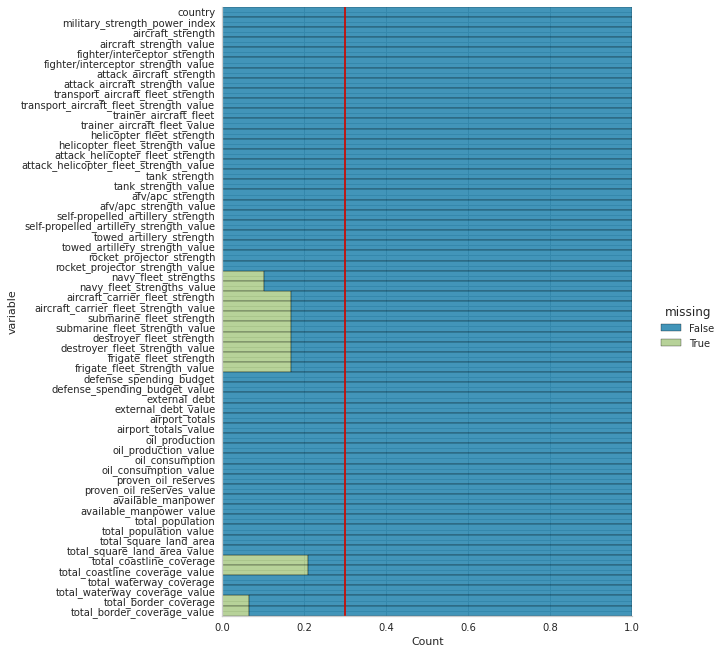

In [38]:
plt.figure(figsize=(4,6))

sns.displot(
    data=df.isnull().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    height=9.25
)

plt.axvline(0.3,color="r");

In [39]:
with pd.option_context('display.max_columns', None):
    display(df[df["total_coastline_coverage"].isna()])

,country,military_strength_power_index,aircraft_strength,aircraft_strength_value,fighter/interceptor_strength,fighter/interceptor_strength_value,attack_aircraft_strength,attack_aircraft_strength_value,transport_aircraft_fleet_strength,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet,trainer_aircraft_fleet_value,helicopter_fleet_strength,helicopter_fleet_strength_value,attack_helicopter_fleet_strength,attack_helicopter_fleet_strength_value,tank_strength,tank_strength_value,afv/apc_strength,afv/apc_strength_value,self-propelled_artillery_strength,self-propelled_artillery_strength_value,towed_artillery_strength,towed_artillery_strength_value,rocket_projector_strength,rocket_projector_strength_value,navy_fleet_strengths,navy_fleet_strengths_value,aircraft_carrier_fleet_strength,aircraft_carrier_fleet_strength_value,submarine_fleet_strength,submarine_fleet_strength_value,destroyer_fleet_strength,destroyer_fleet_strength_value,frigate_fleet_strength,frigate_fleet_strength_value,defense_spending_budget,defense_spending_budget_value,external_debt,external_debt_value,airport_totals,airport_totals_value,oil_production,oil_production_value,oil_consumption,oil_consumption_value,proven_oil_reserves,proven_oil_reserves_value,available_manpower,available_manpower_value,total_population,total_population_value,total_square_land_area,total_square_land_area_value,total_coastline_coverage,total_coastline_coverage_value,total_waterway_coverage,total_waterway_coverage_value,total_border_coverage,total_border_coverage_value
5,Armenia,2.125,Armenia,64,Armenia,0,Armenia,9.000,Armenia,3.000,Armenia,13,Armenia,37,Armenia,20.000,Armenia,110,Armenia,748,Armenia,38,Armenia,150,Armenia,68,Armenia,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Armenia,"1,38,50,00,000",Armenia,"10,41,00,00,000",Armenia,11,Armenia,0,Armenia,"47,500",Armenia,0,Armenia,"16,96,085",Armenia,"30,38,217",Armenia,"29,743",NaN,NaN,Armenia,0,Armenia,"1,570"
7,Austria,0.957,Austria,120,Austria,15,Austria,0.000,Austria,11.000,Austria,32,Austria,62,Austria,0.000,Austria,56,Austria,467,Austria,33,Austria,0,Austria,0,Austria,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Austria,"3,38,00,00,000",Austria,"6,30,80,00,00,000",Austria,52,Austria,"14,260",Austria,"2,15,000",Austria,"4,30,00,000",Austria,"40,17,691",Austria,"87,93,370",Austria,"83,871",NaN,NaN,Austria,0,Austria,"2,524"
11,Belarus,0.818,Belarus,202,Belarus,39,Belarus,68.000,Belarus,4.000,Belarus,28,Belarus,63,Belarus,21.000,Belarus,532,Belarus,"1,560",Belarus,482,Belarus,228,Belarus,238,Belarus,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Belarus,"62,37,02,800",Belarus,"39,92,00,00,000",Belarus,65,Belarus,"32,000",Belarus,"1,90,000",Belarus,"19,80,00,000",Belarus,"49,82,905",Belarus,"95,27,543",Belarus,"2,07,600",NaN,NaN,Belarus,"2,500",Belarus,"3,599"
13,Bhutan,10.168,Bhutan,2,Bhutan,0,Bhutan,0.000,Bhutan,0.000,Bhutan,0,Bhutan,2,Bhutan,0.000,Bhutan,0,Bhutan,27,Bhutan,0,Bhutan,0,Bhutan,0,Bhutan,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bhutan,"2,51,20,000",Bhutan,"2,67,10,00,000",Bhutan,2,Bhutan,0,Bhutan,"2,000",Bhutan,0,Bhutan,"1,76,808",Bhutan,"7,66,397",Bhutan,"38,394",NaN,NaN,Bhutan,0,Bhutan,"1,136"
14,Bolivia,0.994,Bolivia,69,Bolivia,0,Bolivia,0.000,Bolivia,14.000,Bolivia,23,Bolivia,38,Bolivia,0.000,Bolivia,54,Bolivia,137,Bolivia,0,Bolivia,86,Bolivia,0,Bolivia,173.000,Bolivia,0.000,Bolivia,0.000,Bolivia,0.000,Bolivia,0.000,Bolivia,"66,00,00,000",Bolivia,"12,81,00,00,000",Bolivia,855,Bolivia,"59,330",Bolivia,"60,000",Bolivia,"21,15,00,000",Bolivia,"50,75,416",Bolivia,"1,13,06,341",Bolivia,"10,98,581",NaN,NaN,Bolivia,"10,000",Bolivia,"7,252"
16,Botswana,2.058,Botswana,45,Botswana,10,Botswana,0.000,Botswana,11.000,Botswana,8,Botswana,16,Botswana,0.000,Botswana,55,Botswana,245,Botswana,0,Botswana,30,Botswana,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Botswana,"45,00,00,000",Botswana,"2,18,70,00,000",Botswana,74,Botswana,0,Botswana,"16,500",Botswana,0,Botswana,"9,62,617",Botswana,"22,49,104",Botswana,"5,81,730",NaN,NaN,Botswana,0,Botswana,"4,347

In [40]:
value_df.loc[value_df["total_coastline_coverage_value"].isnull(), ['country',
                                                                             'navy_fleet_strengths_value',
                                                                             'aircraft_carrier_fleet_strength_value',
                                                                             'submarine_fleet_strength_value',
                                                                             'destroyer_fleet_strength_value',
                                                                             'frigate_fleet_strength_value',
                                                                             'total_waterway_coverage_value']]

,country,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,total_waterway_coverage_value
5,Armenia,0.000,NaN,NaN,NaN,NaN,0
7,Austria,0.000,NaN,NaN,NaN,NaN,0
11,Belarus,0.000,NaN,NaN,NaN,NaN,"2,500"
13,Bhutan,0.000,NaN,NaN,NaN,NaN,0
14,Bolivia,173.000,0.000,0.000,0.000,0.000,"10,000"
16,Botswana,NaN,NaN,NaN,NaN,NaN,0
19,Burkina Faso,NaN,NaN,NaN,NaN,NaN,0
23,Central African Republic,NaN,NaN,NaN,NaN,NaN,"2,800"
24,Chad,NaN,NaN,NaN,NaN,NaN,0
30,Czechia,NaN,NaN,NaN,NaN,NaN,664


In [41]:
value_df.loc[value_df["total_coastline_coverage_value"].isnull(),
    
    ['navy_fleet_strengths_value',
     'aircraft_carrier_fleet_strength_value',
     'submarine_fleet_strength_value',
     'destroyer_fleet_strength_value',
     'frigate_fleet_strength_value',
     'total_waterway_coverage_value']
    
    ] = 0

<Figure size 288x432 with 0 Axes>

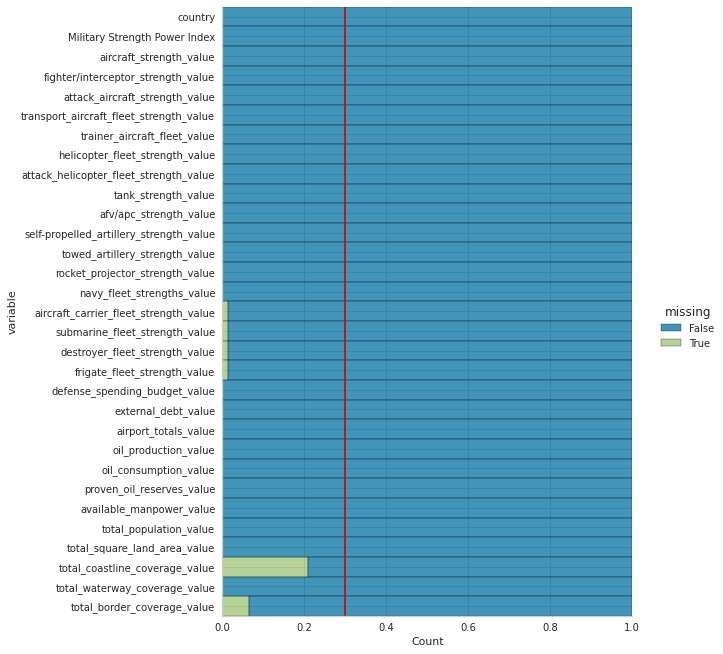

In [42]:
plt.figure(figsize=(4,6))

sns.displot(
    data=value_df.isnull().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    height=9.25
)

plt.axvline(0.3,color="r");

In [43]:
value_df.columns

Index(['country', 'Military Strength Power Index', 'aircraft_strength_value',
       'fighter/interceptor_strength_value', 'attack_aircraft_strength_value',
       'transport_aircraft_fleet_strength_value',
       'trainer_aircraft_fleet_value', 'helicopter_fleet_strength_value',
       'attack_helicopter_fleet_strength_value', 'tank_strength_value',
       'afv/apc_strength_value', 'self-propelled_artillery_strength_value',
       'towed_artillery_strength_value', 'rocket_projector_strength_value',
       'navy_fleet_strengths_value', 'aircraft_carrier_fleet_strength_value',
       'submarine_fleet_strength_value', 'destroyer_fleet_strength_value',
       'frigate_fleet_strength_value', 'defense_spending_budget_value',
       'external_debt_value', 'airport_totals_value', 'oil_production_value',
       'oil_consumption_value', 'proven_oil_reserves_value',
       'available_manpower_value', 'total_population_value',
       'total_square_land_area_value', 'total_coastline_coverage_value

In [44]:
value_df.loc[value_df['aircraft_carrier_fleet_strength_value'].isnull()|
             value_df['submarine_fleet_strength_value'].isnull()|
             value_df['destroyer_fleet_strength_value'].isnull()|
             value_df['frigate_fleet_strength_value'].isnull()] 

,country,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,total_square_land_area_value,total_coastline_coverage_value,total_waterway_coverage_value,total_border_coverage_value
110,South Korea,0.151,"1,649",414,71.000,41.000,298,803,112.000,"2,614","14,000","3,040","3,854",575,234.000,NaN,NaN,NaN,NaN,"44,00,00,00,000","3,84,60,00,00,000",111,0,"28,00,000",0,"2,57,09,049","5,14,18,097","99,720","2,413","1,600",237
132,Uzbekistan,0.809,185,66,20.000,18.000,2,79,25.000,420,"1,215",137,0,98,0.000,NaN,NaN,NaN,NaN,"97,50,00,000","16,90,00,00,000",53,"46,070","1,42,000","59,40,00,000","1,59,12,566","3,00,23,709","4,47,400",420,"1,100","6,893"


In [45]:
value_df.loc[value_df["country"] == "Uzbekistan",
            ['navy_fleet_strengths_value',
             'aircraft_carrier_fleet_strength_value',
             'submarine_fleet_strength_value',
             'destroyer_fleet_strength_value',
             'frigate_fleet_strength_value',
           ]] 

,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value
132,0.000,NaN,NaN,NaN,NaN


In [46]:
value_df.loc[value_df["country"] == "Uzbekistan",
            ['navy_fleet_strengths_value',
             'aircraft_carrier_fleet_strength_value',
             'submarine_fleet_strength_value',
             'destroyer_fleet_strength_value',
             'frigate_fleet_strength_value',
           ]] = 0

In [47]:
value_df.loc[value_df["country"] == "South Korea",
            ['navy_fleet_strengths_value',
             'aircraft_carrier_fleet_strength_value',
             'submarine_fleet_strength_value',
             'destroyer_fleet_strength_value',
             'frigate_fleet_strength_value',
           ]] 

,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value
110,234.000,NaN,NaN,NaN,NaN


In [48]:
value_df.loc[((value_df['navy_fleet_strengths_value'] > 200) & 
             (value_df['navy_fleet_strengths_value'] < 250)),
            ['country',
             'navy_fleet_strengths_value',
             'aircraft_carrier_fleet_strength_value',
             'submarine_fleet_strength_value',
             'destroyer_fleet_strength_value',
             'frigate_fleet_strength_value',
           ]] 

,country,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value
2,Algeria,201.000,0.000,6.000,0.000,5.000
39,Finland,246.000,0.000,0.000,0.000,0.000
55,Italy,249.000,2.000,8.000,4.000,12.000
110,South Korea,234.000,NaN,NaN,NaN,NaN


In [49]:
value_df.loc[value_df["country"] == "France",
            ['country',
             'navy_fleet_strengths_value',
             'aircraft_carrier_fleet_strength_value',
             'submarine_fleet_strength_value',
             'destroyer_fleet_strength_value',
             'frigate_fleet_strength_value',
           ]] 

,country,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value
40,France,180.000,4.000,9.000,11.000,11.000


In [50]:
# All the numbers derived from South Korea Navy wikipeida page

value_df.loc[value_df["country"] == "South Korea",'aircraft_carrier_fleet_strength_value'] = 2
value_df.loc[value_df["country"] == "South Korea",'submarine_fleet_strength_value'] = 19
value_df.loc[value_df["country"] == "South Korea",'destroyer_fleet_strength_value'] = 12
value_df.loc[value_df["country"] == "South Korea",'frigate_fleet_strength_value'] = 12

<Figure size 288x432 with 0 Axes>

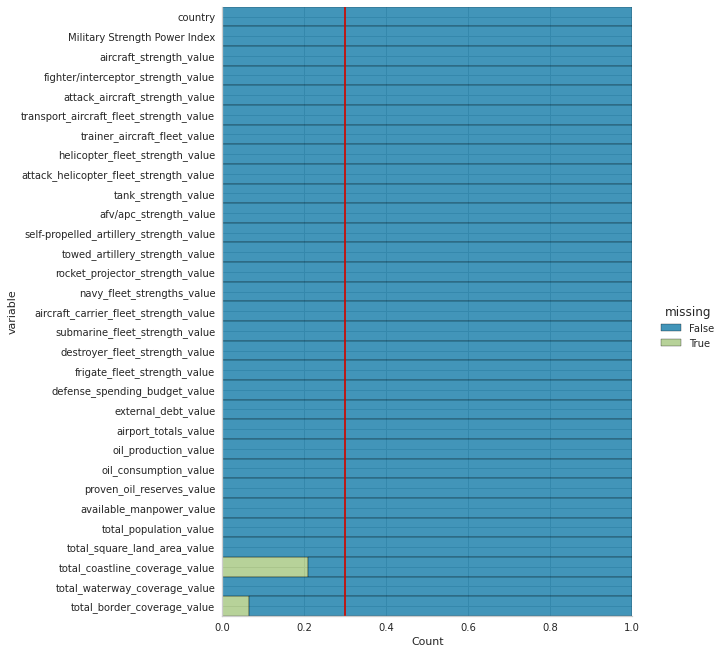

In [51]:
plt.figure(figsize=(4,6))

sns.displot(
    data=value_df.isnull().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    height=9.25
)

plt.axvline(0.3,color="r");

In [52]:
value_df.loc[value_df['total_coastline_coverage_value'].isnull()]

,country,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,total_square_land_area_value,total_coastline_coverage_value,total_waterway_coverage_value,total_border_coverage_value
5,Armenia,2.125,64,0,9.000,3.000,13,37,20.000,110,748,38,150,68,0.000,0.000,0.000,0.000,0.000,"1,38,50,00,000","10,41,00,00,000",11,0,"47,500",0,"16,96,085","30,38,217","29,743",NaN,0,"1,570"
7,Austria,0.957,120,15,0.000,11.000,32,62,0.000,56,467,33,0,0,0.000,0.000,0.000,0.000,0.000,"3,38,00,00,000","6,30,80,00,00,000",52,"14,260","2,15,000","4,30,00,000","40,17,691","87,93,370","83,871",NaN,0,"2,524"
11,Belarus,0.818,202,39,68.000,4.000,28,63,21.000,532,"1,560",482,228,238,0.000,0.000,0.000,0.000,0.000,"62,37,02,800","39,92,00,00,000",65,"32,000","1,90,000","19,80,00,000","49,82,905","95,27,543","2,07,600",NaN,0,"3,599"
13,Bhutan,10.168,2,0,0.000,0.000,0,2,0.000,0,27,0,0,0,0.000,0.000,0.000,0.000,0.000,"2,51,20,000","2,67,10,00,000",2,0,"2,000",0,"1,76,808","7,66,397","38,394",NaN,0,"1,136"
14,Bolivia,0.994,69,0,0.000,14.000,23,38,0.000,54,137,0,86,0,0.000,0.000,0.000,0.000,0.000,"66,00,00,000","12,81,00,00,000",855,"59,330","60,000","21,15,00,000","50,75,416","1,13,06,341","10,98,581",NaN,0,"7,252"
16,Botswana,2.058,45,10,0.000,11.000,8,16,0.000,55,245,0,30,20,0.000,0.000,0.000,0.000,0.000,"45,00,00,000","2,18,70,00,000",74,0,"16,500",0,"9,62,617","22,49,104","5,81,730",NaN,0,"4,347"
19,Burkina Faso,1.901,16,0,3.000,1.000,4,8,2.000,0,350,0,0,0,0.000,0.000,0.000,0.000,0.000,"13,00,00,000","3,05,60,00,000",23,0,"10,500",0,"78,00,000","1,97,42,715","2,74,200",NaN,0,"3,611"
23,Central African Republic,3.289,3,0,0.000,2.000,0,1,0.000,4,55,0,20,0,0.000,0.000,0.000,0.000,0.000,"2,00,00,000","77,99,00,000",39,0,"4,500",0,"23,48,581","57,45,062","6,22,984",NaN,0,"5,920"
24,Chad,1.638,35,0,6.000,6.000,4,17,3.000,60,372,10,51,10,0.000,0.000,0.000,0.000,0.000,"20,00,00,000","1,72,40,00,000",59,"1,28,000","1,00,000","1,50,00,00,000","60,30,834","1,58,33,116","12,84,000",NaN,0,"6,406"
30,Czechia,0.553,95,12,16.000,8.000,15,44,15.000,116,682,86,85,0,0.000,0.000,0.000,0.000,0.000,"2,96,90,00,000","2,05,20,00,00,000",128,"2,000","2,00,000","1,50,00,000","50,11,174","1,06,86,269","78,867",NaN,0,"2,046"


In [53]:
value_df.loc[value_df['total_coastline_coverage_value'].isnull(), 
                      'total_coastline_coverage_value']  = 0 

In [54]:
value_df.loc[value_df['total_border_coverage_value'].isnull()]

,country,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,total_square_land_area_value,total_coastline_coverage_value,total_waterway_coverage_value,total_border_coverage_value
6,Australia,0.323,464,82,6.000,38.000,174,133,22.000,59,"3,051",0,54,0,48.000,2.000,6.000,2.000,8.000,"26,30,00,00,000","17,14,00,00,00,000",480,"2,63,000","10,05,000","1,82,10,00,000","1,08,08,002","2,34,70,145","77,41,220","25,760","2,000",NaN
9,Bahrain,1.855,109,17,0.000,2.000,37,65,22.000,180,843,33,26,17,39.000,0.000,0.000,0.000,1.000,"1,41,50,00,000","52,15,00,00,000",4,"45,000","55,000","12,46,00,000","8,06,505","14,22,659",760,161,0,NaN
57,Japan,0.150,"1,561",279,12.000,60.000,427,637,119.000,"1,004","3,130",238,500,99,155.000,4.000,20.000,40.000,0.000,"49,00,00,00,000","32,40,00,00,00,000",175,"3,841","40,00,000","4,41,20,000","5,38,73,803","12,61,68,156","3,77,915","29,751","1,770",NaN
69,Madagascar,3.087,6,0,0.000,0.000,0,6,0.000,12,103,0,25,0,8.000,0.000,0.000,0.000,0.000,"11,50,00,000","4,08,90,00,000",83,0,"18,500",0,"1,01,45,026","2,56,83,610","5,87,040","4,828",600,NaN
83,New Zealand,1.368,48,0,0.000,7.000,13,22,0.000,0,200,0,24,0,11.000,0.000,0.000,0.000,2.000,"4,30,00,00,000","91,62,00,00,000",123,"31,480","1,50,000","5,69,00,000","21,15,989","45,45,627","2,67,710","15,134",0,NaN
95,Philippines,0.785,171,0,19.000,23.000,24,97,0.000,7,513,0,286,0,103.000,0.000,0.000,0.000,2.000,"3,47,00,00,000","76,18,00,00,000",247,"15,000","3,20,000","13,85,00,000","5,18,87,757","10,58,93,381","3,00,000","36,289","3,219",NaN
105,Singapore,0.797,235,100,0.000,9.000,36,77,17.000,180,"3,000",48,77,24,40.000,0.000,0.000,0.000,6.000,"11,20,00,00,000","5,66,10,00,00,000",9,0,"13,40,000",0,"40,17,314","59,95,991",697,193,10,NaN
113,Sri Lanka,1.466,77,0,0.000,15.000,6,54,9.000,202,570,0,209,22,40.000,0.000,0.000,0.000,0.000,"2,50,00,00,000","51,72,00,00,000",19,0,"90,000",0,"1,09,27,071","2,25,76,592","65,610","1,340",160,NaN
119,Taiwan,0.401,744,289,0.000,19.000,207,210,91.000,"1,180","2,000",482,"1,160",115,117.000,0.000,4.000,4.000,22.000,"10,72,50,00,000","1,81,90,00,00,000",37,196,"10,32,000","23,80,000","1,21,96,809","2,35,45,963","35,980","1,566","3,720",NaN


In [55]:
value_df.loc[value_df['total_border_coverage_value'].isnull(), 
                      'total_border_coverage_value' ] = 0

<Figure size 288x432 with 0 Axes>

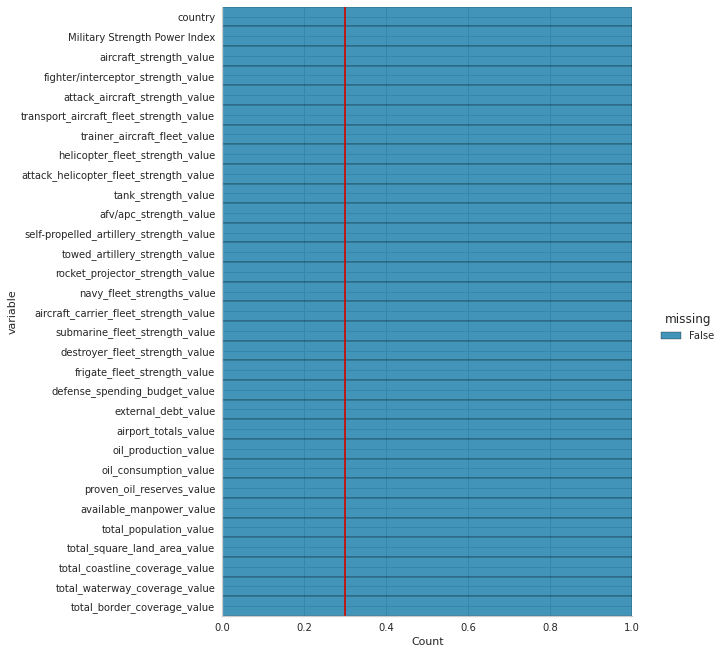

In [56]:
plt.figure(figsize=(4,6))

sns.displot(
    data=value_df.isnull().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    height=9.25
)

plt.axvline(0.3,color="r");

In [57]:
value_df.reset_index(drop=True, inplace=True)

In [58]:
value_df

,country,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,total_square_land_area_value,total_coastline_coverage_value,total_waterway_coverage_value,total_border_coverage_value
0,Afghanistan,1.344,260,0,25.000,30.000,0,187,0.000,0,"1,062",0,176,50,0.000,0.000,0.000,0.000,0.000,"12,00,00,00,000","2,84,00,00,000",43,0,"5,500",0,"1,43,25,743","3,49,40,837","6,52,230",0,"1,200","5,987"
1,Albania,2.314,19,0,0.000,0.000,0,19,0.000,0,467,0,0,0,38.000,0.000,0.000,0.000,0.000,"25,00,00,000","9,50,50,00,000",4,"16,000","42,500","16,83,00,000","15,19,438","30,57,220","28,748",362,41,691
2,Algeria,0.466,551,103,22.000,59.000,87,257,45.000,880,"7,361",320,240,316,201.000,0.000,6.000,0.000,5.000,"13,00,00,00,000","6,26,00,00,000",157,"13,06,000","3,25,000","12,20,00,00,000","2,07,41,263","4,16,57,488","23,81,741",998,0,"6,734"
3,Angola,0.838,295,72,18.000,30.000,47,126,15.000,379,595,28,357,115,57.000,0.000,0.000,0.000,0.000,"7,00,00,00,000","42,08,00,00,000",176,"16,66,000","82,300","8,27,30,00,000","62,44,205","3,03,55,880","12,46,700","1,600","1,300","5,369"
4,Argentina,0.652,227,24,7.000,9.000,64,100,0.000,370,739,83,172,26,49.000,0.000,2.000,4.000,0.000,"4,20,00,00,000","2,14,90,00,00,000","1,138","4,79,400","6,85,000","2,18,50,00,000","2,01,79,430","4,46,94,198","27,80,400","4,989","11,000","11,968"
5,Armenia,2.125,64,0,9.000,3.000,13,37,20.000,110,748,38,150,68,0.000,0.000,0.000,0.000,0.000,"1,38,50,00,000","10,41,00,00,000",11,0,"47,500",0,"16,96,085","30,38,217","29,743",0,0,"1,570"
6,Australia,0.323,464,82,6.000,38.000,174,133,22.000,59,"3,051",0,54,0,48.000,2.000,6.000,2.000,8.000,"26,30,00,00,000","17,14,00,00,00,000",480,"2,63,000","10,05,000","1,82,10,00,000","1,08,08,002","2,34,70,145","77,41,220","25,760","2,000",0
7,Austria,0.957,120,15,0.000,11.000,32,62,0.000,56,467,33,0,0,0.000,0.000,0.000,0.000,0.000,"3,38,00,00,000","6,30,80,00,00,000",52,"14,260","2,15,000","4,30,00,000","40,17,691","87,93,370","83,871",0,0,"2,524"
8,Azerbaijan,0.946,147,17,12.000,1.000,29,88,17.000,570,"1,451",187,227,162,31.000,0.000,4.000,0.000,1.000,"2,80,50,00,000","17,41,00,00,000",37,"7,89,300","1,80,000","7,00,00,00,000","50,42,346","1,00,46,516","86,600",713,0,"2,468"
9,Bahrain,1.855,109,17,0.000,2.000,37,65,22.000,180,843,33,26,17,39.000,0.000,0.000,0.000,1.000,"1,41,50,00,000","52,15,00,00,000",4,"45,000","55,000","12,46,00,000","8,06,505","14,22,659",760,161,0,0


<a id="4.4"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.4 Handling With Data Types</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [59]:
value_df.dtypes

country                                     object
Military Strength Power Index              float64
aircraft_strength_value                     object
fighter/interceptor_strength_value          object
attack_aircraft_strength_value             float64
transport_aircraft_fleet_strength_value    float64
trainer_aircraft_fleet_value                object
helicopter_fleet_strength_value             object
attack_helicopter_fleet_strength_value     float64
tank_strength_value                         object
afv/apc_strength_value                      object
self-propelled_artillery_strength_value     object
towed_artillery_strength_value              object
rocket_projector_strength_value             object
navy_fleet_strengths_value                 float64
aircraft_carrier_fleet_strength_value      float64
submarine_fleet_strength_value             float64
destroyer_fleet_strength_value             float64
frigate_fleet_strength_value               float64
defense_spending_budget_value  

In [60]:
value_df.select_dtypes("object")

,country,aircraft_strength_value,fighter/interceptor_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,total_square_land_area_value,total_coastline_coverage_value,total_waterway_coverage_value,total_border_coverage_value
0,Afghanistan,260,0,0,187,0,"1,062",0,176,50,"12,00,00,00,000","2,84,00,00,000",43,0,"5,500",0,"1,43,25,743","3,49,40,837","6,52,230",0,"1,200","5,987"
1,Albania,19,0,0,19,0,467,0,0,0,"25,00,00,000","9,50,50,00,000",4,"16,000","42,500","16,83,00,000","15,19,438","30,57,220","28,748",362,41,691
2,Algeria,551,103,87,257,880,"7,361",320,240,316,"13,00,00,00,000","6,26,00,00,000",157,"13,06,000","3,25,000","12,20,00,00,000","2,07,41,263","4,16,57,488","23,81,741",998,0,"6,734"
3,Angola,295,72,47,126,379,595,28,357,115,"7,00,00,00,000","42,08,00,00,000",176,"16,66,000","82,300","8,27,30,00,000","62,44,205","3,03,55,880","12,46,700","1,600","1,300","5,369"
4,Argentina,227,24,64,100,370,739,83,172,26,"4,20,00,00,000","2,14,90,00,00,000","1,138","4,79,400","6,85,000","2,18,50,00,000","2,01,79,430","4,46,94,198","27,80,400","4,989","11,000","11,968"
5,Armenia,64,0,13,37,110,748,38,150,68,"1,38,50,00,000","10,41,00,00,000",11,0,"47,500",0,"16,96,085","30,38,217","29,743",0,0,"1,570"
6,Australia,464,82,174,133,59,"3,051",0,54,0,"26,30,00,00,000","17,14,00,00,00,000",480,"2,63,000","10,05,000","1,82,10,00,000","1,08,08,002","2,34,70,145","77,41,220","25,760","2,000",0
7,Austria,120,15,32,62,56,467,33,0,0,"3,38,00,00,000","6,30,80,00,00,000",52,"14,260","2,15,000","4,30,00,000","40,17,691","87,93,370","83,871",0,0,"2,524"
8,Azerbaijan,147,17,29,88,570,"1,451",187,227,162,"2,80,50,00,000","17,41,00,00,000",37,"7,89,300","1,80,000","7,00,00,00,000","50,42,346","1,00,46,516","86,600",713,0,"2,468"
9,Bahrain,109,17,37,65,180,843,33,26,17,"1,41,50,00,000","52,15,00,00,000",4,"45,000","55,000","12,46,00,000","8,06,505","14,22,659",760,161,0,0


In [61]:
value_df = value_df.reset_index()   # df = df.reset_index(drop = True)
del value_df['index']

In [62]:
value_df.set_index('country', inplace=True)

In [63]:
for col in value_df.columns:
    if value_df.dtypes[col] == np.object:
        value_df[col] = value_df[col].apply(lambda x : x.replace(",", "") if type(x) != int else x).astype("float")

In [64]:
value_df.head()

,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,total_square_land_area_value,total_coastline_coverage_value,total_waterway_coverage_value,total_border_coverage_value
country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,1.344,260.000,0.000,25.000,30.000,0.000,187.000,0.000,0.000,1062.000,0.000,176.000,50.000,0.000,0.000,0.000,0.000,0.000,12000000000.000,2840000000.000,43.000,0.000,5500.000,0.000,14325743.000,34940837.000,652230.000,0.000,1200.000,5987.000
Albania,2.314,19.000,0.000,0.000,0.000,0.000,19.000,0.000,0.000,467.000,0.000,0.000,0.000,38.000,0.000,0.000,0.000,0.000,250000000.000,9505000000.000,4.000,16000.000,42500.000,168300000.000,1519438.000,3057220.000,28748.000,362.000,41.000,691.000
Algeria,0.466,551.000,103.000,22.000,59.000,87.000,257.000,45.000,880.000,7361.000,320.000,240.000,316.000,201.000,0.000,6.000,0.000,5.000,13000000000.000,6260000000.000,157.000,1306000.000,325000.000,12200000000.000,20741263.000,41657488.000,2381741.000,998.000,0.000,6734.000
Angola,0.838,295.000,72.000,18.000,30.000,47.000,126.000,15.000,379.000,595.000,28.000,357.000,115.000,57.000,0.000,0.000,0.000,0.000,7000000000.000,42080000000.000,176.000,1666000.000,82300.000,8273000000.000,6244205.000,30355880.000,1246700.000,1600.000,1300.000,5369.000
Argentina,0.652,227.000,24.000,7.000,9.000,64.000,100.000,0.000,370.000,739.000,83.000,172.000,26.000,49.000,0.000,2.000,4.000,0.000,4200000000.000,214900000000.000,1138.000,479400.000,685000.000,2185000000.000,20179430.000,44694198.000,2780400.000,4989.000,11000.000,11968.000


In [65]:
value_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 138 entries, Afghanistan to Zimbabwe
Data columns (total 30 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Military Strength Power Index            138 non-null    float64
 1   aircraft_strength_value                  138 non-null    float64
 2   fighter/interceptor_strength_value       138 non-null    float64
 3   attack_aircraft_strength_value           138 non-null    float64
 4   transport_aircraft_fleet_strength_value  138 non-null    float64
 5   trainer_aircraft_fleet_value             138 non-null    float64
 6   helicopter_fleet_strength_value          138 non-null    float64
 7   attack_helicopter_fleet_strength_value   138 non-null    float64
 8   tank_strength_value                      138 non-null    float64
 9   afv/apc_strength_value                   138 non-null    float64
 10  self-propelled_artillery_strength_value 

In [66]:
missing(value_df)

,Missing_Number,Missing_Percent
Military Strength Power Index,0,0.000
aircraft_strength_value,0,0.000
total_waterway_coverage_value,0,0.000
total_coastline_coverage_value,0,0.000
total_square_land_area_value,0,0.000
total_population_value,0,0.000
available_manpower_value,0,0.000
proven_oil_reserves_value,0,0.000
oil_consumption_value,0,0.000
oil_production_value,0,0.000


<a id="4.5"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.5 The Selection of Features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**We will drop the features that do NOT affect military power**

* Hint-1,  Georeferences not proper features

In [67]:
value_df.columns

Index(['Military Strength Power Index', 'aircraft_strength_value',
       'fighter/interceptor_strength_value', 'attack_aircraft_strength_value',
       'transport_aircraft_fleet_strength_value',
       'trainer_aircraft_fleet_value', 'helicopter_fleet_strength_value',
       'attack_helicopter_fleet_strength_value', 'tank_strength_value',
       'afv/apc_strength_value', 'self-propelled_artillery_strength_value',
       'towed_artillery_strength_value', 'rocket_projector_strength_value',
       'navy_fleet_strengths_value', 'aircraft_carrier_fleet_strength_value',
       'submarine_fleet_strength_value', 'destroyer_fleet_strength_value',
       'frigate_fleet_strength_value', 'defense_spending_budget_value',
       'external_debt_value', 'airport_totals_value', 'oil_production_value',
       'oil_consumption_value', 'proven_oil_reserves_value',
       'available_manpower_value', 'total_population_value',
       'total_square_land_area_value', 'total_coastline_coverage_value',
       '

In [68]:
# Georeferences

# "total_coastline_coverage_value"
# "total_waterway_coverage_value"
# "total_border_coverage_value"
# "total_square_land_area_value"

In [69]:
value_df.drop(['total_square_land_area_value',
               'total_coastline_coverage_value',
               'total_waterway_coverage_value',
               'total_border_coverage_value'], axis=1, inplace=True)

In [70]:
value_df.shape

(138, 26)

<a id="4.6"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.6 The Visualization of Some Features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Let's visualize some features for a better understanding of the data**

In [71]:
value_df.head()

,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value
country,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,1.344,260.000,0.000,25.000,30.000,0.000,187.000,0.000,0.000,1062.000,0.000,176.000,50.000,0.000,0.000,0.000,0.000,0.000,12000000000.000,2840000000.000,43.000,0.000,5500.000,0.000,14325743.000,34940837.000
Albania,2.314,19.000,0.000,0.000,0.000,0.000,19.000,0.000,0.000,467.000,0.000,0.000,0.000,38.000,0.000,0.000,0.000,0.000,250000000.000,9505000000.000,4.000,16000.000,42500.000,168300000.000,1519438.000,3057220.000
Algeria,0.466,551.000,103.000,22.000,59.000,87.000,257.000,45.000,880.000,7361.000,320.000,240.000,316.000,201.000,0.000,6.000,0.000,5.000,13000000000.000,6260000000.000,157.000,1306000.000,325000.000,12200000000.000,20741263.000,41657488.000
Angola,0.838,295.000,72.000,18.000,30.000,47.000,126.000,15.000,379.000,595.000,28.000,357.000,115.000,57.000,0.000,0.000,0.000,0.000,7000000000.000,42080000000.000,176.000,1666000.000,82300.000,8273000000.000,6244205.000,30355880.000
Argentina,0.652,227.000,24.000,7.000,9.000,64.000,100.000,0.000,370.000,739.000,83.000,172.000,26.000,49.000,0.000,2.000,4.000,0.000,4200000000.000,214900000000.000,1138.000,479400.000,685000.000,2185000000.000,20179430.000,44694198.000


**Although it does NOT present a good visualization in our case since we have so many features; nevertheless, it is always good to apply pairplot for a better understanding of relationships between variables.**  

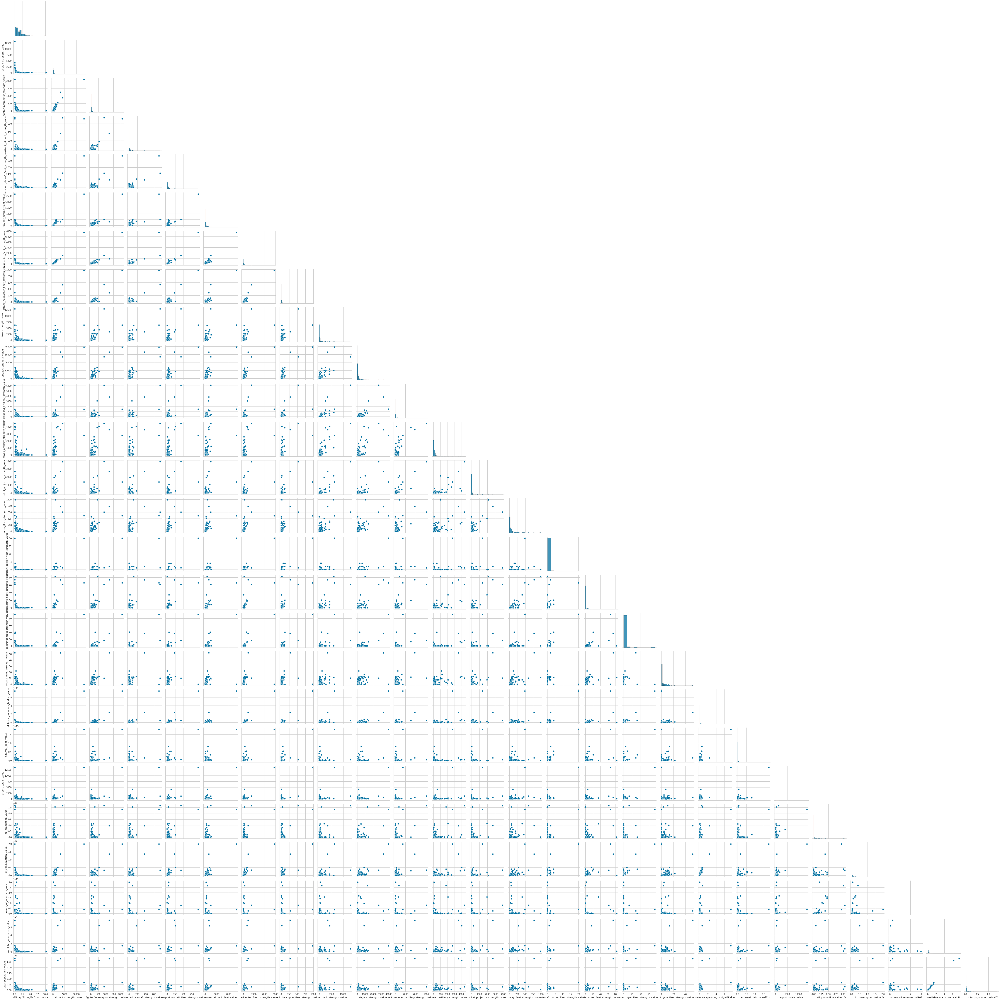

In [72]:
sns.pairplot(value_df, palette="inferno", corner=True);

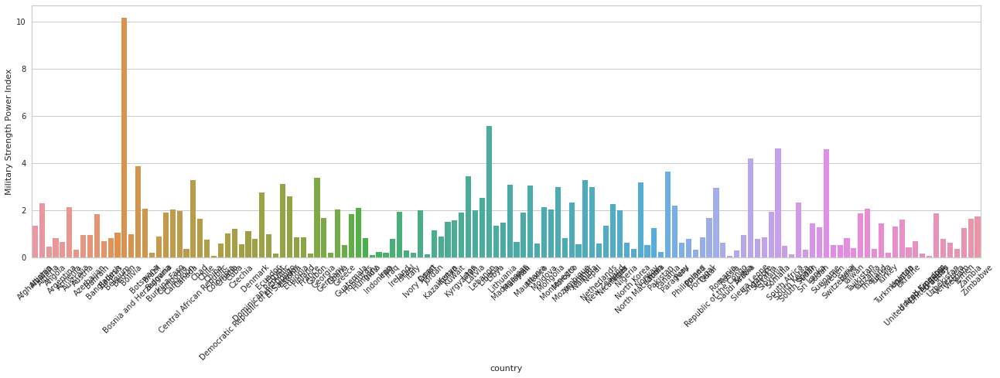

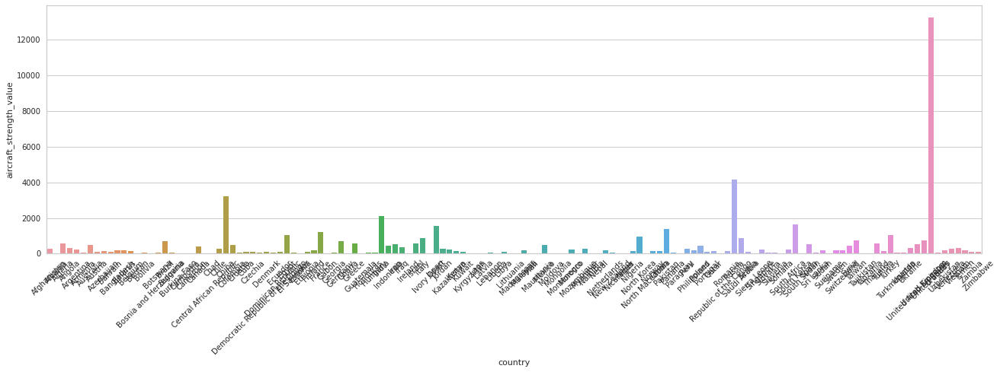

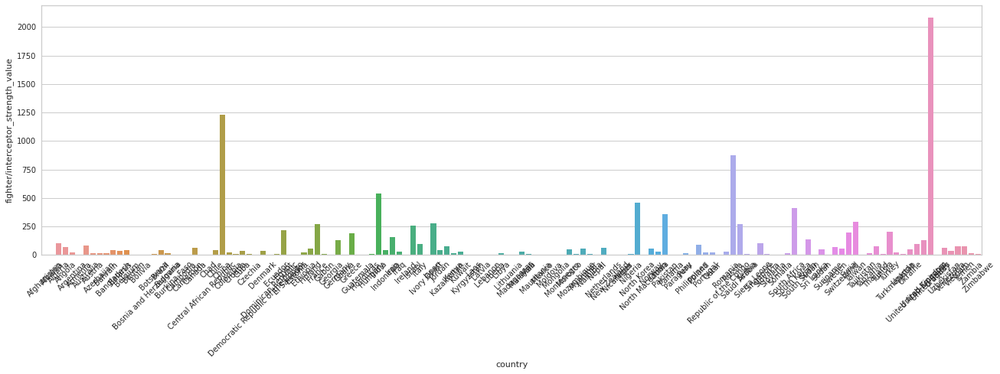

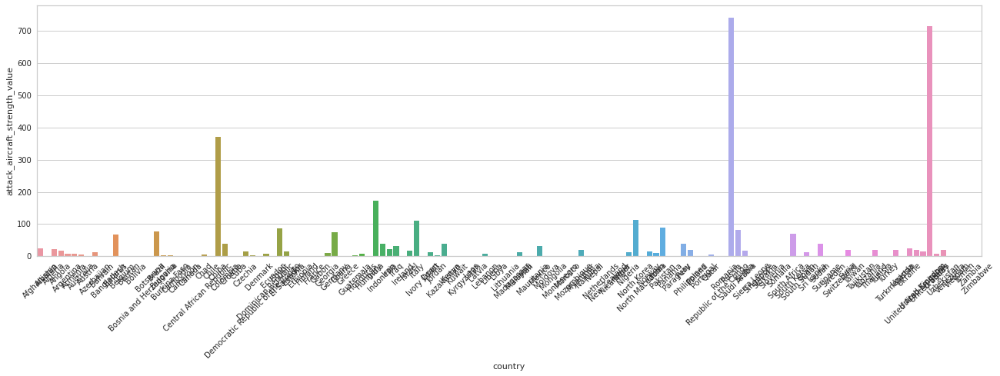

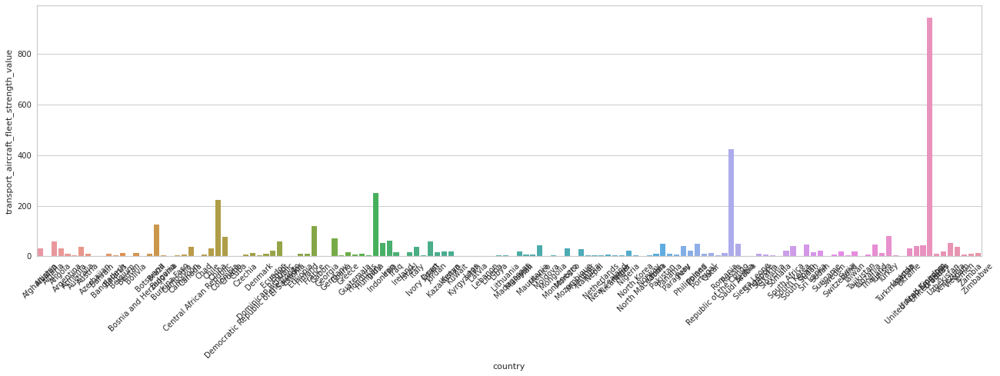

...

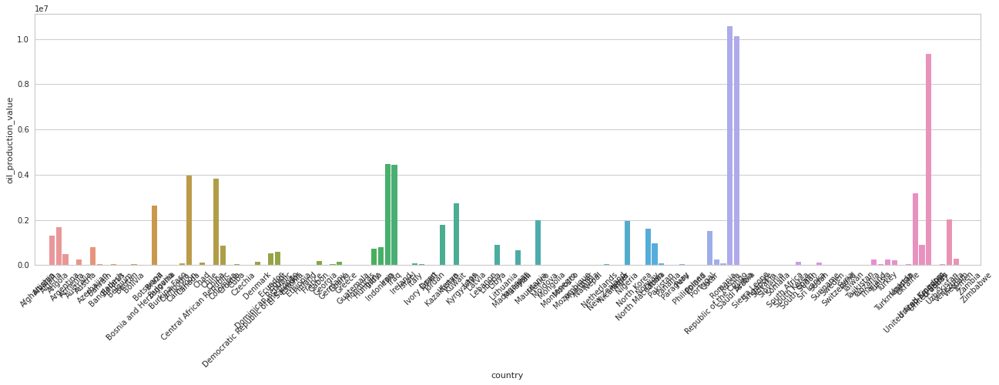

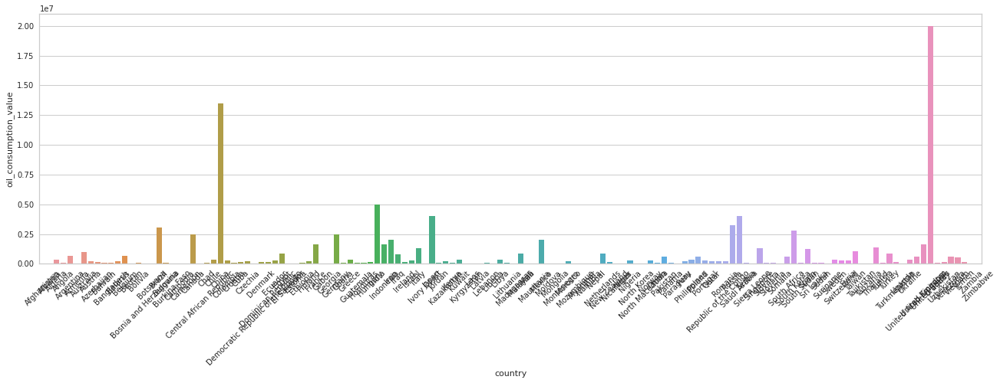

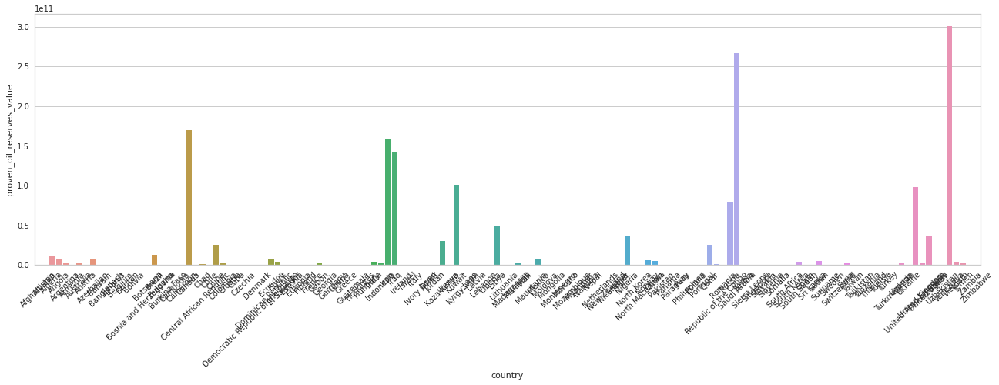

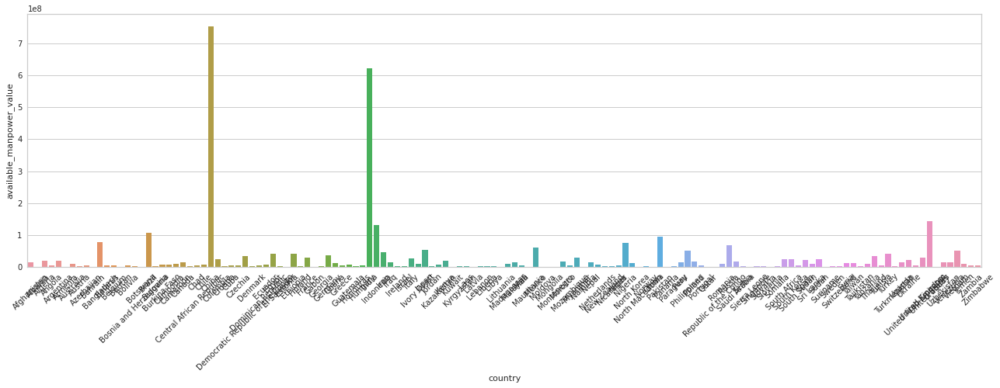

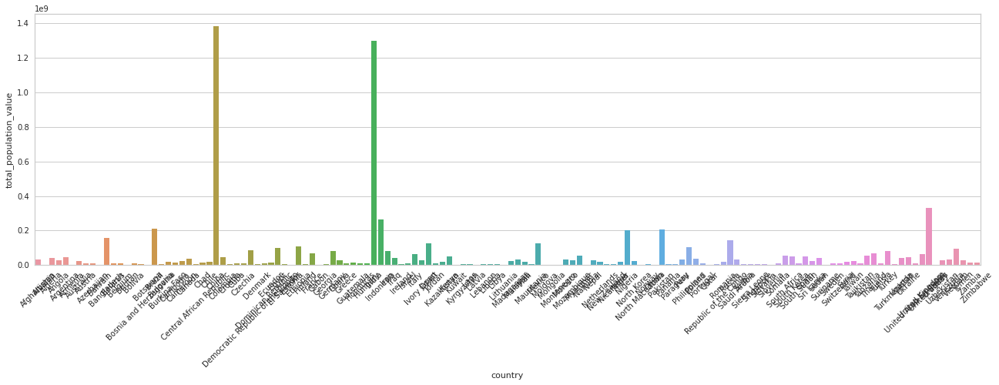

In [73]:
for col in value_df.columns:
    plt.figure(figsize = (22,6))
    sns.barplot(y = value_df[col], x = value_df.index, data = value_df)
    plt.xticks(rotation = 45);

In [74]:
value_df.iplot(kind='hist');

In [75]:
for i in value_df:
    value_df[i].iplot(kind="box", title=i, boxpoints="all", color='lightseagreen')

In [76]:
fig = px.imshow(value_df.corr(), aspect='auto')
fig.show()

<a id="4.7"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.7 Descriptive Statistics</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [77]:
value_df.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu')

,count,mean,std,min,25%,50%,75%,max
Military Strength Power Index,138.000000,1.460716,1.324018,0.060600,0.574800,1.034100,2.021525,10.168100
aircraft_strength_value,138.000000,388.471014,1231.981859,0.000000,33.000000,111.000000,290.250000,13264.000000
fighter/interceptor_strength_value,138.000000,81.565217,230.324777,0.000000,0.000000,17.000000,60.500000,2085.000000
attack_aircraft_strength_value,138.000000,25.760870,94.528222,0.000000,0.000000,0.000000,15.750000,742.000000
transport_aircraft_fleet_strength_value,138.000000,30.231884,92.330436,0.000000,3.000000,9.000000,26.000000,945.000000
trainer_aircraft_fleet_value,138.000000,82.833333,240.803721,0.000000,4.250000,26.000000,79.250000,2643.000000
helicopter_fleet_strength_value,138.000000,154.065217,520.183631,0.000000,15.250000,44.000000,126.750000,5768.000000
attack_helicopter_fleet_strength_value,138.000000,25.623188,97.326091,0.000000,0.000000,2.000000,17.750000,967.000000
tank_strength_value,138.000000,646.565217,1515.463683,0.000000,19.250000,153.000000,436.250000,12950.000000
afv/apc_strength_value,138.000000,2485.695652,5410.546392,0.000000,250.250000,734.500000,2000.000000,39253.000000


<a id="5"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">5 - DATA PREPROCESSING</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [78]:
value_df.head()

,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value
country,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,1.344,260.000,0.000,25.000,30.000,0.000,187.000,0.000,0.000,1062.000,0.000,176.000,50.000,0.000,0.000,0.000,0.000,0.000,12000000000.000,2840000000.000,43.000,0.000,5500.000,0.000,14325743.000,34940837.000
Albania,2.314,19.000,0.000,0.000,0.000,0.000,19.000,0.000,0.000,467.000,0.000,0.000,0.000,38.000,0.000,0.000,0.000,0.000,250000000.000,9505000000.000,4.000,16000.000,42500.000,168300000.000,1519438.000,3057220.000
Algeria,0.466,551.000,103.000,22.000,59.000,87.000,257.000,45.000,880.000,7361.000,320.000,240.000,316.000,201.000,0.000,6.000,0.000,5.000,13000000000.000,6260000000.000,157.000,1306000.000,325000.000,12200000000.000,20741263.000,41657488.000
Angola,0.838,295.000,72.000,18.000,30.000,47.000,126.000,15.000,379.000,595.000,28.000,357.000,115.000,57.000,0.000,0.000,0.000,0.000,7000000000.000,42080000000.000,176.000,1666000.000,82300.000,8273000000.000,6244205.000,30355880.000
Argentina,0.652,227.000,24.000,7.000,9.000,64.000,100.000,0.000,370.000,739.000,83.000,172.000,26.000,49.000,0.000,2.000,4.000,0.000,4200000000.000,214900000000.000,1138.000,479400.000,685000.000,2185000000.000,20179430.000,44694198.000


In [79]:
value_df.reset_index(inplace=True)

In [80]:
value_df.head()

,country,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value
0,Afghanistan,1.344,260.000,0.000,25.000,30.000,0.000,187.000,0.000,0.000,1062.000,0.000,176.000,50.000,0.000,0.000,0.000,0.000,0.000,12000000000.000,2840000000.000,43.000,0.000,5500.000,0.000,14325743.000,34940837.000
1,Albania,2.314,19.000,0.000,0.000,0.000,0.000,19.000,0.000,0.000,467.000,0.000,0.000,0.000,38.000,0.000,0.000,0.000,0.000,250000000.000,9505000000.000,4.000,16000.000,42500.000,168300000.000,1519438.000,3057220.000
2,Algeria,0.466,551.000,103.000,22.000,59.000,87.000,257.000,45.000,880.000,7361.000,320.000,240.000,316.000,201.000,0.000,6.000,0.000,5.000,13000000000.000,6260000000.000,157.000,1306000.000,325000.000,12200000000.000,20741263.000,41657488.000
3,Angola,0.838,295.000,72.000,18.000,30.000,47.000,126.000,15.000,379.000,595.000,28.000,357.000,115.000,57.000,0.000,0.000,0.000,0.000,7000000000.000,42080000000.000,176.000,1666000.000,82300.000,8273000000.000,6244205.000,30355880.000
4,Argentina,0.652,227.000,24.000,7.000,9.000,64.000,100.000,0.000,370.000,739.000,83.000,172.000,26.000,49.000,0.000,2.000,4.000,0.000,4200000000.000,214900000000.000,1138.000,479400.000,685000.000,2185000000.000,20179430.000,44694198.000


<a id="5.1"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.1 The Implementation of Scaling</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Scaling of the data comes under the set of steps of data pre-processing when we are performing machine learning algorithms in the data set. As we know most of the supervised and unsupervised learning methods make decisions according to the data sets applied to them and often the algorithms calculate the distance between the data points to make better inferences out of the data. So in most cases we should scale our data. For instance k-means is scaling dependent as it computes a distance between the two samples.**

**For a better understanding and more information why scaling is so important in Machine Learning, please refer to [external link text](https://analyticsindiamag.com/why-data-scaling-is-important-in-machine-learning-how-to-effectively-do-it/)**


In [81]:
X = value_df.drop(["country"], axis=1)

In [82]:
X.head()

,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value
0,1.344,260.000,0.000,25.000,30.000,0.000,187.000,0.000,0.000,1062.000,0.000,176.000,50.000,0.000,0.000,0.000,0.000,0.000,12000000000.000,2840000000.000,43.000,0.000,5500.000,0.000,14325743.000,34940837.000
1,2.314,19.000,0.000,0.000,0.000,0.000,19.000,0.000,0.000,467.000,0.000,0.000,0.000,38.000,0.000,0.000,0.000,0.000,250000000.000,9505000000.000,4.000,16000.000,42500.000,168300000.000,1519438.000,3057220.000
2,0.466,551.000,103.000,22.000,59.000,87.000,257.000,45.000,880.000,7361.000,320.000,240.000,316.000,201.000,0.000,6.000,0.000,5.000,13000000000.000,6260000000.000,157.000,1306000.000,325000.000,12200000000.000,20741263.000,41657488.000
3,0.838,295.000,72.000,18.000,30.000,47.000,126.000,15.000,379.000,595.000,28.000,357.000,115.000,57.000,0.000,0.000,0.000,0.000,7000000000.000,42080000000.000,176.000,1666000.000,82300.000,8273000000.000,6244205.000,30355880.000
4,0.652,227.000,24.000,7.000,9.000,64.000,100.000,0.000,370.000,739.000,83.000,172.000,26.000,49.000,0.000,2.000,4.000,0.000,4200000000.000,214900000000.000,1138.000,479400.000,685000.000,2185000000.000,20179430.000,44694198.000


In [83]:
scaler = scale

In [84]:
X_scaled = pd.DataFrame(scaler(X))

In [85]:
X_scaled.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25
0,-0.088,-0.105,-0.355,-0.008,-0.003,-0.345,0.064,-0.264,-0.428,-0.264,-0.309,-0.272,-0.222,-0.529,-0.177,-0.317,-0.187,-0.486,-0.030,-0.281,-0.204,-0.353,-0.322,-0.280,-0.132,-0.111
1,0.647,-0.301,-0.355,-0.274,-0.329,-0.345,-0.261,-0.264,-0.428,-0.374,-0.309,-0.491,-0.325,-0.259,-0.177,-0.317,-0.187,-0.486,-0.205,-0.277,-0.237,-0.343,-0.305,-0.276,-0.284,-0.305
2,-0.754,0.132,0.093,-0.040,0.313,0.017,0.199,0.200,0.155,0.904,0.157,-0.192,0.330,0.901,-0.177,0.161,-0.187,0.355,-0.015,-0.279,-0.110,0.434,-0.174,0.006,-0.056,-0.070
3,-0.472,-0.076,-0.042,-0.082,-0.003,-0.149,-0.054,-0.110,-0.177,-0.351,-0.269,-0.046,-0.087,-0.124,-0.177,-0.317,-0.187,-0.486,-0.104,-0.259,-0.094,0.650,-0.287,-0.086,-0.228,-0.139
4,-0.613,-0.132,-0.251,-0.199,-0.231,-0.078,-0.104,-0.264,-0.183,-0.324,-0.188,-0.276,-0.271,-0.180,-0.177,-0.158,0.251,-0.486,-0.146,-0.165,0.702,-0.064,-0.008,-0.229,-0.063,-0.052


In [86]:
X_scaled.shape

(138, 26)

<a id="6"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">6 - MODELLING WITH K-MEANS</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**K-Means is the simplest and commonly used iterative type unsupervised learning algorithm. In this Umsupervised algorithm, the K number of centroids in the data is randomly initialized  (the number of optimal K is found using the Elbow method) and iterates these centroids until no change happens to the position of the centroid. Let’s go through the steps involved in K means clustering for a better understanding.**
 
**- 1) Select the number of clusters for the dataset (K).**
 
**- 2) Select K number of centroids.**
 
**- 3) By calculating the Euclidean distance or Manhattan distance assign the points to the nearest centroid, thus creating K groups.**
 
**- 4) Now find the original centroid in each group.**
 
**- 5) Again reassign the whole data point based on this new centroid, then repeat step 4 until the position of the centroid doesn’t change.**
 
**Finding the optimal number of clusters is an important part of this algorithm. A commonly used method for finding optimal K value is Elbow Method.**

**For a better understanding and more information about K-Means in Machine Learning, please refer to [external link text](https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/)**

<a id="6.1"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.1 Hopkins Test</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Assess the clusterability of a dataset. A score between 0 and 1, a score around 0.5 express no clusterability, a score tending to 1 express an uniform distrubution so clustering can't be useful and  0 express  not an uniform distrubution hence clusterering can be useful.**

In [87]:
X_scaled1 = X_scaled.copy()
X_scaled2 = X_scaled.copy()
X_scaled3 = X_scaled.copy()

In [88]:
hopkins(scale(X_scaled1), X_scaled1.shape[0])

0.07417726598502891

In [89]:
hopkins(MinMaxScaler().fit_transform(X_scaled2), X_scaled2.shape[0])

0.0816356381868973

In [90]:
hopkins(StandardScaler().fit_transform(X_scaled3), X_scaled3.shape[0])

0.07524582851667726

In [91]:
hopkins(scale(X_scaled1), X_scaled1.shape[0])

0.07530390281495493

<a id="6.2"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.2 The Implementation of K-Means</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [92]:
# With default value of n_clusters=8

K_means_model1 = KMeans(random_state = 101)

In [93]:
K_means_model1.fit_predict(X)

array([0, 0, 0, 0, 0, 0, 3, 5, 0, 0, 0, 0, 3, 0, 0, 0, 0, 5, 0, 0, 0, 0,
       3, 0, 0, 0, 3, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 4,
       0, 5, 0, 0, 0, 5, 5, 0, 0, 7, 0, 7, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0,
       0, 5, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 5, 0, 0, 0, 5, 0, 0, 0, 0,
       5, 0, 7, 0, 0, 0, 5, 3, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 1, 2, 0,
       0, 0, 0, 0, 0, 0], dtype=int32)

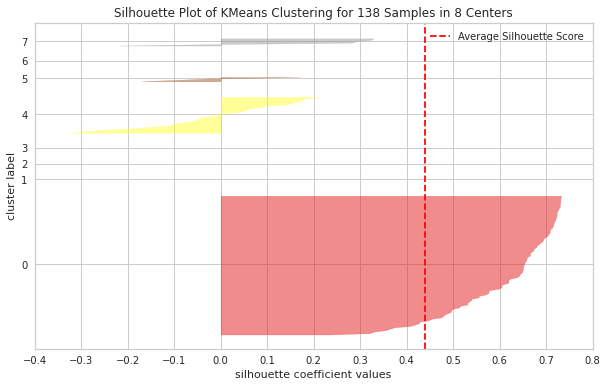

In [94]:
K_means_model1 = KMeans(n_clusters=8, random_state=101)
visualizer = SilhouetteVisualizer(K_means_model1)

visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();

<a id="6.2.1"></a>
#### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.2.1 Finding The Best K Value With Elbow Method</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**In the Elbow method, we are actually varying the number of clusters (K) from 1 – 10. For each value of K, we are calculating WCSS ( Within-Cluster Sum of Square ). WCSS is the sum of squared distance (SSD) between each point and the centroid in a cluster. When we plot the WCSS with the K value, the plot looks like an Elbow. As the number of clusters increases, the WCSS value will start to decrease. WCSS value is largest when K=1. When we analyze the graph we can see that the graph will rapidly change at a point and thus creating an elbow shape. From this point, the graph starts to move almost parallel to the X-axis. The K value corresponding to this point is the optimal K value or an optimal number of clusters.**

**So, in short, we use this method to find optimal k value by looking up to break point of graph.**

**For a better understanding and more information about Elbow Method in Machine Learning, please refer to [external link text](https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/)**

In [95]:
ssd = []

K = range(2, 11)

for k in K:
    model = KMeans(n_clusters=k, random_state=101)
    model.fit(X_scaled)
    ssd.append(model.inertia_)

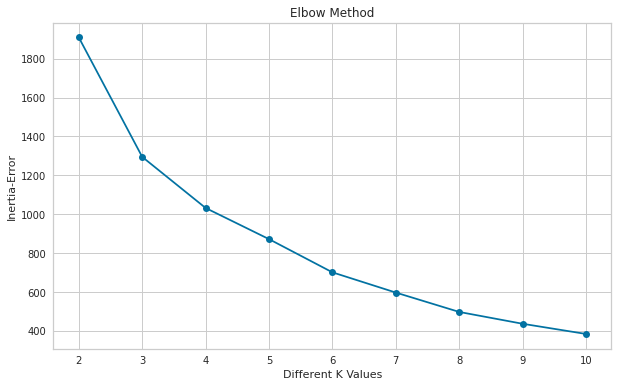

In [96]:
plt.plot(K, ssd, "bo-")
plt.xlabel("Different K Values")
plt.ylabel("Inertia-Error") 
plt.title("Elbow Method"); 

In [97]:
ssd # sum of squared distance

[1909.4825400661186,
 1294.9499703756715,
 1032.0768081318024,
 871.8309424424074,
 700.9826518601566,
 596.8408007852493,
 497.1817936686724,
 436.33942850872063,
 383.8874595052435]

**Let's make a close look at the differences between SSD scores**

In [98]:
pd.Series(ssd).diff()

0        NaN
1   -614.533
2   -262.873
3   -160.246
4   -170.848
5   -104.142
6    -99.659
7    -60.842
8    -52.452
dtype: float64

In [99]:
df1_diff =pd.DataFrame(-pd.Series(ssd).diff()).rename(index = lambda x : x+1)
df1_diff

,0
1,NaN
2,614.533
3,262.873
4,160.246
5,170.848
6,104.142
7,99.659
8,60.842
9,52.452


**Sometimes bar plot gives a better understending of determininf optimal K valuefor analysis.**

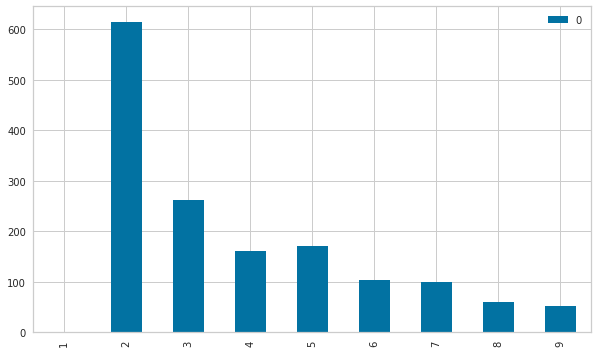

In [100]:
df1_diff.plot(kind='bar');

**Nevertheless, KElbowVisualizer is one of the best option for selecting optimal K value.**

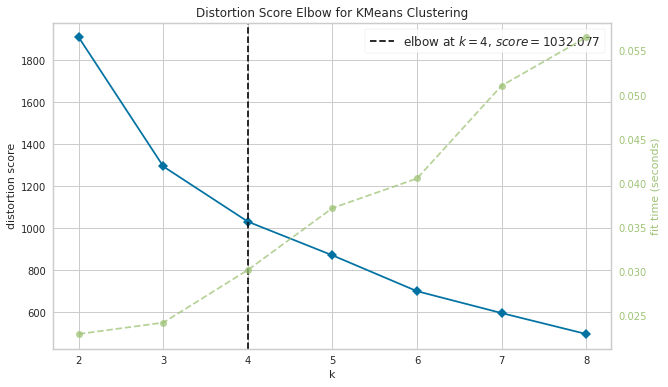

In [101]:
from yellowbrick.cluster import KElbowVisualizer

model_ = KMeans(random_state=101)
visualizer = KElbowVisualizer(model_, k=(2, 9))

visualizer.fit(X_scaled)        # Fit the data to the visualizer
visualizer.show();

<a id="6.2.2"></a>
#### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.2.2 The Implementation of K-Means With Optimal K Value & Visualization</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>


In [102]:
# With optimal K value

K_means_model2 = KMeans(n_clusters = 4, random_state = 101)

K_means_model2.fit_predict(X_scaled)

array([0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0,
       3, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 3,
       0, 3, 0, 0, 0, 3, 3, 3, 3, 0, 3, 3, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 3,
       0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0,
       3, 0, 3, 0, 0, 0, 0, 0, 3, 3, 0, 0, 3, 0, 3, 0, 0, 3, 3, 3, 1, 0,
       0, 3, 3, 0, 0, 0], dtype=int32)

In [103]:
K_means_model2.labels_

array([0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0,
       3, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 3,
       0, 3, 0, 0, 0, 3, 3, 3, 3, 0, 3, 3, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 3,
       0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0,
       3, 0, 3, 0, 0, 0, 0, 0, 3, 3, 0, 0, 3, 0, 3, 0, 0, 3, 3, 3, 1, 0,
       0, 3, 3, 0, 0, 0], dtype=int32)

In [104]:
K_means_model2.inertia_

1032.0768081318024

In [105]:
value_df["K-Means_cluster"] = K_means_model2.labels_

In [106]:
value_df.head()

,country,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,K-Means_cluster
0,Afghanistan,1.344,260.000,0.000,25.000,30.000,0.000,187.000,0.000,0.000,1062.000,0.000,176.000,50.000,0.000,0.000,0.000,0.000,0.000,12000000000.000,2840000000.000,43.000,0.000,5500.000,0.000,14325743.000,34940837.000,0
1,Albania,2.314,19.000,0.000,0.000,0.000,0.000,19.000,0.000,0.000,467.000,0.000,0.000,0.000,38.000,0.000,0.000,0.000,0.000,250000000.000,9505000000.000,4.000,16000.000,42500.000,168300000.000,1519438.000,3057220.000,0
2,Algeria,0.466,551.000,103.000,22.000,59.000,87.000,257.000,45.000,880.000,7361.000,320.000,240.000,316.000,201.000,0.000,6.000,0.000,5.000,13000000000.000,6260000000.000,157.000,1306000.000,325000.000,12200000000.000,20741263.000,41657488.000,3
3,Angola,0.838,295.000,72.000,18.000,30.000,47.000,126.000,15.000,379.000,595.000,28.000,357.000,115.000,57.000,0.000,0.000,0.000,0.000,7000000000.000,42080000000.000,176.000,1666000.000,82300.000,8273000000.000,6244205.000,30355880.000,0
4,Argentina,0.652,227.000,24.000,7.000,9.000,64.000,100.000,0.000,370.000,739.000,83.000,172.000,26.000,49.000,0.000,2.000,4.000,0.000,4200000000.000,214900000000.000,1138.000,479400.000,685000.000,2185000000.000,20179430.000,44694198.000,0


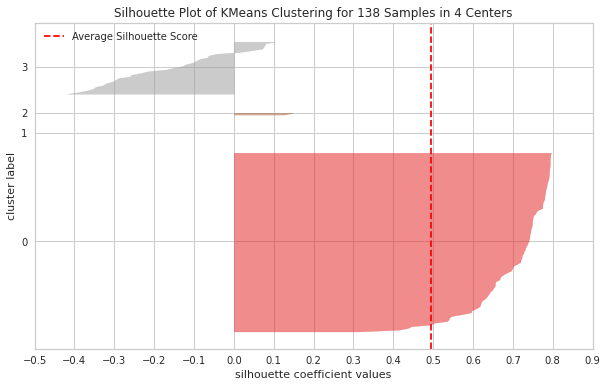

In [107]:
K_means_model2 = KMeans(n_clusters=4, random_state=101)
visualizer = SilhouetteVisualizer(K_means_model2)

visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();

In [108]:
value_df["K-Means_cluster"].value_counts()

0    104
3     31
2      2
1      1
Name: K-Means_cluster, dtype: int64

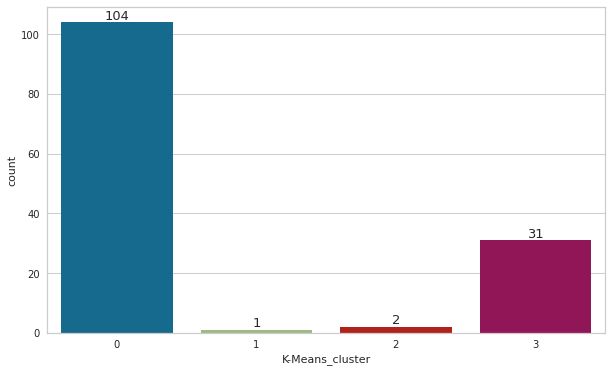

In [109]:
value_df["K-Means_cluster"].value_counts()

sns.countplot(x=value_df["K-Means_cluster"], data=value_df)

for index, value in enumerate(value_df["K-Means_cluster"].value_counts().sort_index()):
     plt.text(index, value, f"{value}", ha="center", va="bottom", fontsize = 13)

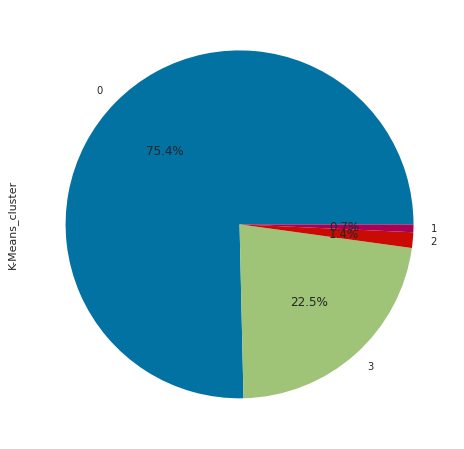

In [110]:
value_df["K-Means_cluster"].value_counts().plot(kind="pie", startangle=0, labeldistance=1.1, autopct='%1.1f%%',figsize=(10, 8));

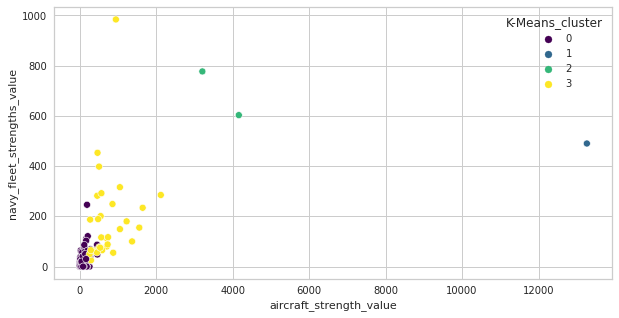

In [111]:
plt.figure(figsize=(10, 5))

sns.scatterplot(value_df["aircraft_strength_value"], 
                value_df["navy_fleet_strengths_value"], hue=value_df["K-Means_cluster"], palette= "viridis");

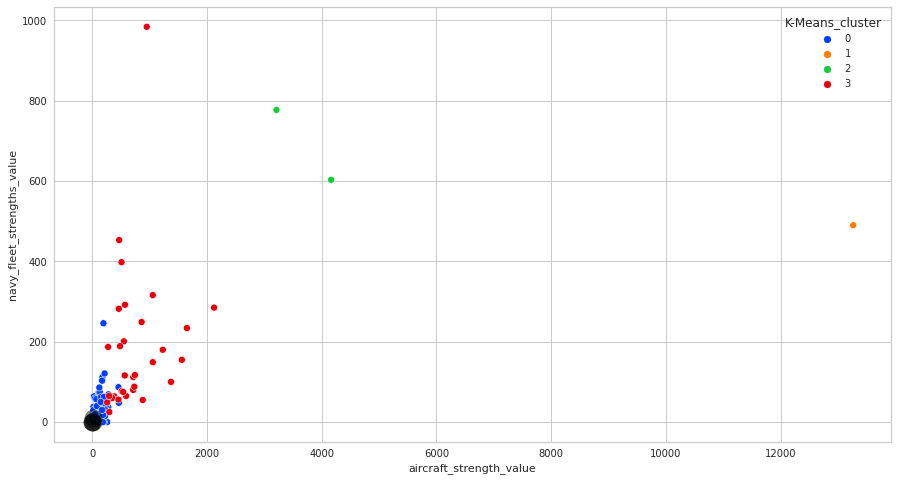

In [112]:
plt.figure(figsize=(15, 8))

sns.scatterplot(value_df["aircraft_strength_value"], 
                value_df["navy_fleet_strengths_value"], hue=value_df["K-Means_cluster"], data=value_df["K-Means_cluster"], palette="bright")

centers = K_means_model2.cluster_centers_
plt.scatter(centers[:, 2], centers[:, 14], c='black', s=300, alpha=0.5);

In [113]:
fig = px.scatter_3d(x=value_df["aircraft_strength_value"],
                   y=value_df["defense_spending_budget_value"],
                   z=value_df["external_debt_value"],
                   color=value_df["K-Means_cluster"],
                   labels = {"x": "aircraft_strength_value",
                             "y": "defense_spending_budget_value",
                             "z": "external_debt_value"},
                   hover_name=value_df["country"])

fig.show()

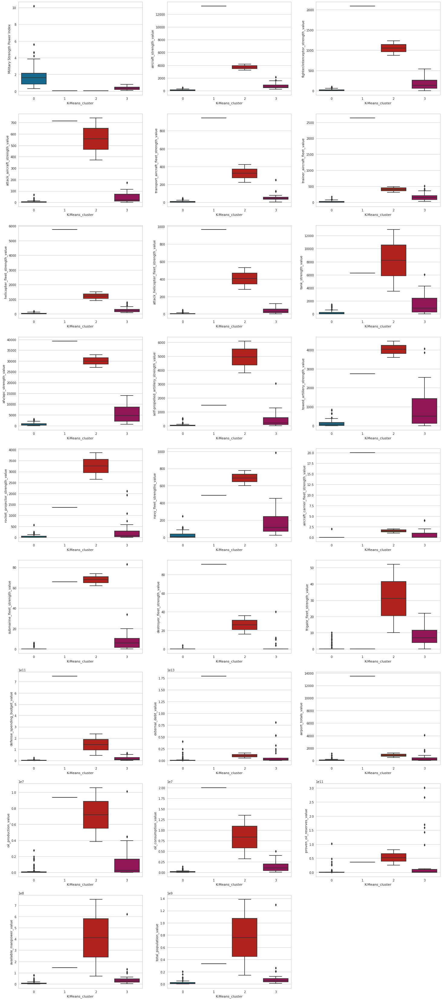

In [114]:
index = 0
plt.figure(figsize=(25, 60))

for feature in value_df.drop("country", axis=1):
    if feature != "K-Means_cluster":
        index += 1
        plt.subplot(9, 3, index)
        sns.boxplot(x="K-Means_cluster", y=feature, data=value_df)

In [115]:
value_df[value_df["K-Means_cluster"] == 0][["country", "Military Strength Power Index"]].sort_values(by="Military Strength Power Index")

,country,Military Strength Power Index
6,Australia,0.323
96,Poland,0.340
109,South Africa,0.498
117,Switzerland,0.526
89,Norway,0.528
116,Sweden,0.530
30,Czechia,0.553
82,Netherlands,0.592
100,Romania,0.618
94,Peru,0.622


In [116]:
value_df[value_df["K-Means_cluster"] == 1][["country", "Military Strength Power Index"]].sort_values(by="Military Strength Power Index")

,country,Military Strength Power Index
130,United States,0.061


In [117]:
value_df[value_df["K-Means_cluster"] == 2][["country", "Military Strength Power Index"]].sort_values(by="Military Strength Power Index")

,country,Military Strength Power Index
101,Russia,0.068
26,China,0.069


In [118]:
value_df[value_df["K-Means_cluster"] == 3][["country", "Military Strength Power Index"]].sort_values(by="Military Strength Power Index")

,country,Military Strength Power Index
49,India,0.095
57,Japan,0.150
110,South Korea,0.151
40,France,0.170
129,United Kingdom,0.172
35,Egypt,0.187
17,Brazil,0.199
124,Turkey,0.210
55,Italy,0.211
43,Germany,0.219


<a id="6.2.3"></a>
#### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.2.3 The Assesment of Silhouette Scores</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

Silhouette score is used to evaluate the quality of clusters created using clustering algorithms such as K-Means in terms of how well samples are clustered with other samples that are similar to each other. The Silhouette score is calculated for each sample of different clusters. 

**For a better understanding and more information about The Assesment of Silhouette Scores in Machine Learning, please refer to [external link text](https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam)**

In [119]:
print(f'Silhouette Score(n=4): {silhouette_score(X_scaled, value_df["K-Means_cluster"])}') # towards to 1 means, data good clustered by model

Silhouette Score(n=4): 0.4956608189413285


In [120]:
range_n_clusters = range(2, 9)

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, random_state=101)
    kmeans.fit(X_scaled)
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    print(f"For n_clusters={num_clusters}, the silhouette score is {silhouette_avg}")

For n_clusters=2, the silhouette score is 0.8644786857054572
For n_clusters=3, the silhouette score is 0.8193950812093086
For n_clusters=4, the silhouette score is 0.4956608189413285
For n_clusters=5, the silhouette score is 0.4936713029688351
For n_clusters=6, the silhouette score is 0.48669858072616184
For n_clusters=7, the silhouette score is 0.48632074984250384
For n_clusters=8, the silhouette score is 0.4397800366403439


**Let's calculate group mean for each feature**

In [121]:
value_df.columns

Index(['country', 'Military Strength Power Index', 'aircraft_strength_value',
       'fighter/interceptor_strength_value', 'attack_aircraft_strength_value',
       'transport_aircraft_fleet_strength_value',
       'trainer_aircraft_fleet_value', 'helicopter_fleet_strength_value',
       'attack_helicopter_fleet_strength_value', 'tank_strength_value',
       'afv/apc_strength_value', 'self-propelled_artillery_strength_value',
       'towed_artillery_strength_value', 'rocket_projector_strength_value',
       'navy_fleet_strengths_value', 'aircraft_carrier_fleet_strength_value',
       'submarine_fleet_strength_value', 'destroyer_fleet_strength_value',
       'frigate_fleet_strength_value', 'defense_spending_budget_value',
       'external_debt_value', 'airport_totals_value', 'oil_production_value',
       'oil_consumption_value', 'proven_oil_reserves_value',
       'available_manpower_value', 'total_population_value',
       'K-Means_cluster'],
      dtype='object')

In [122]:
value_df.head()

,country,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,K-Means_cluster
0,Afghanistan,1.344,260.000,0.000,25.000,30.000,0.000,187.000,0.000,0.000,1062.000,0.000,176.000,50.000,0.000,0.000,0.000,0.000,0.000,12000000000.000,2840000000.000,43.000,0.000,5500.000,0.000,14325743.000,34940837.000,0
1,Albania,2.314,19.000,0.000,0.000,0.000,0.000,19.000,0.000,0.000,467.000,0.000,0.000,0.000,38.000,0.000,0.000,0.000,0.000,250000000.000,9505000000.000,4.000,16000.000,42500.000,168300000.000,1519438.000,3057220.000,0
2,Algeria,0.466,551.000,103.000,22.000,59.000,87.000,257.000,45.000,880.000,7361.000,320.000,240.000,316.000,201.000,0.000,6.000,0.000,5.000,13000000000.000,6260000000.000,157.000,1306000.000,325000.000,12200000000.000,20741263.000,41657488.000,3
3,Angola,0.838,295.000,72.000,18.000,30.000,47.000,126.000,15.000,379.000,595.000,28.000,357.000,115.000,57.000,0.000,0.000,0.000,0.000,7000000000.000,42080000000.000,176.000,1666000.000,82300.000,8273000000.000,6244205.000,30355880.000,0
4,Argentina,0.652,227.000,24.000,7.000,9.000,64.000,100.000,0.000,370.000,739.000,83.000,172.000,26.000,49.000,0.000,2.000,4.000,0.000,4200000000.000,214900000000.000,1138.000,479400.000,685000.000,2185000000.000,20179430.000,44694198.000,0


In [123]:
X_scaled.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25
0,-0.088,-0.105,-0.355,-0.008,-0.003,-0.345,0.064,-0.264,-0.428,-0.264,-0.309,-0.272,-0.222,-0.529,-0.177,-0.317,-0.187,-0.486,-0.030,-0.281,-0.204,-0.353,-0.322,-0.280,-0.132,-0.111
1,0.647,-0.301,-0.355,-0.274,-0.329,-0.345,-0.261,-0.264,-0.428,-0.374,-0.309,-0.491,-0.325,-0.259,-0.177,-0.317,-0.187,-0.486,-0.205,-0.277,-0.237,-0.343,-0.305,-0.276,-0.284,-0.305
2,-0.754,0.132,0.093,-0.040,0.313,0.017,0.199,0.200,0.155,0.904,0.157,-0.192,0.330,0.901,-0.177,0.161,-0.187,0.355,-0.015,-0.279,-0.110,0.434,-0.174,0.006,-0.056,-0.070
3,-0.472,-0.076,-0.042,-0.082,-0.003,-0.149,-0.054,-0.110,-0.177,-0.351,-0.269,-0.046,-0.087,-0.124,-0.177,-0.317,-0.187,-0.486,-0.104,-0.259,-0.094,0.650,-0.287,-0.086,-0.228,-0.139
4,-0.613,-0.132,-0.251,-0.199,-0.231,-0.078,-0.104,-0.264,-0.183,-0.324,-0.188,-0.276,-0.271,-0.180,-0.177,-0.158,0.251,-0.486,-0.146,-0.165,0.702,-0.064,-0.008,-0.229,-0.063,-0.052


In [124]:
X_scaled.set_axis(['Military Strength Power Index', 'aircraft_strength_value',
       'fighter/interceptor_strength_value', 'attack_aircraft_strength_value',
       'transport_aircraft_fleet_strength_value',
       'trainer_aircraft_fleet_value', 'helicopter_fleet_strength_value',
       'attack_helicopter_fleet_strength_value', 'tank_strength_value',
       'afv/apc_strength_value', 'self-propelled_artillery_strength_value',
       'towed_artillery_strength_value', 'rocket_projector_strength_value',
       'navy_fleet_strengths_value', 'aircraft_carrier_fleet_strength_value',
       'submarine_fleet_strength_value', 'destroyer_fleet_strength_value',
       'frigate_fleet_strength_value', 'defense_spending_budget_value',
       'external_debt_value', 'airport_totals_value', 'oil_production_value',
       'oil_consumption_value', 'proven_oil_reserves_value',
       'available_manpower_value', 'total_population_value'], axis=1, inplace=True)

In [125]:
X_scaled.head()

,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value
0,-0.088,-0.105,-0.355,-0.008,-0.003,-0.345,0.064,-0.264,-0.428,-0.264,-0.309,-0.272,-0.222,-0.529,-0.177,-0.317,-0.187,-0.486,-0.030,-0.281,-0.204,-0.353,-0.322,-0.280,-0.132,-0.111
1,0.647,-0.301,-0.355,-0.274,-0.329,-0.345,-0.261,-0.264,-0.428,-0.374,-0.309,-0.491,-0.325,-0.259,-0.177,-0.317,-0.187,-0.486,-0.205,-0.277,-0.237,-0.343,-0.305,-0.276,-0.284,-0.305
2,-0.754,0.132,0.093,-0.040,0.313,0.017,0.199,0.200,0.155,0.904,0.157,-0.192,0.330,0.901,-0.177,0.161,-0.187,0.355,-0.015,-0.279,-0.110,0.434,-0.174,0.006,-0.056,-0.070
3,-0.472,-0.076,-0.042,-0.082,-0.003,-0.149,-0.054,-0.110,-0.177,-0.351,-0.269,-0.046,-0.087,-0.124,-0.177,-0.317,-0.187,-0.486,-0.104,-0.259,-0.094,0.650,-0.287,-0.086,-0.228,-0.139
4,-0.613,-0.132,-0.251,-0.199,-0.231,-0.078,-0.104,-0.264,-0.183,-0.324,-0.188,-0.276,-0.271,-0.180,-0.177,-0.158,0.251,-0.486,-0.146,-0.165,0.702,-0.064,-0.008,-0.229,-0.063,-0.052


In [126]:
X_scaled["K-Means_cluster"] = value_df["K-Means_cluster"]

In [127]:
cluster_mean = X_scaled.groupby("K-Means_cluster").mean().T
cluster_mean

K-Means_cluster,0,1,2,3
Military Strength Power Index,0.277,-1.061,-1.055,-0.827
aircraft_strength_value,-0.240,10.489,2.687,0.293
fighter/interceptor_strength_value,-0.281,8.730,4.231,0.387
attack_aircraft_strength_value,-0.223,7.318,5.635,0.147
transport_aircraft_fleet_strength_value,-0.234,9.944,3.193,0.259
trainer_aircraft_fleet_value,-0.250,10.670,1.345,0.407
helicopter_fleet_strength_value,-0.221,10.832,2.050,0.258
attack_helicopter_fleet_strength_value,-0.211,9.708,3.923,0.143
tank_strength_value,-0.297,3.737,5.019,0.553
afv/apc_strength_value,-0.332,6.820,5.107,0.563


In [128]:
fig= px.line(cluster_mean, width=1000, height=500)
fig.show()

<a id="7"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">7 - MODELLING WITH HIERARCHICAL CLUSTER ANALYSIS (HCA)</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**In general, Hierarchical Clustering Algorithm (HCA) is an unsupervised clustering algorithm which involves creating clusters that have predominant ordering from top to bottom.**

**The algorithm groups similar objects into groups called clusters. The endpoint is a set of clusters or groups, where each cluster is distinct from each other cluster, and the objects within each cluster are broadly similar to each other.**

**This clustering technique is divided into two types:**

**- Agglomerative Hierarchical Clustering**
**- Divisive Hierarchical Clustering**

**For a better understanding and more information about Hierarchical Clustering (HCA) in Machine Learning, please refer to [external link text](https://www.kdnuggets.com/2019/09/hierarchical-clustering.html)**

<a id="7.1"></a>
#### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">7.1 The Assesment of Dentrogram</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**A dendrogram is a diagram that shows the hierarchical relationship between objects. It is most commonly created as an output from hierarchical clustering. The main use of a dendrogram is to work out the best way to allocate objects to clusters.** 

**For a better understanding and more information about Dentrogram in Machine Learning, please refer to [external link text](https://www.displayr.com/what-is-dendrogram/)**

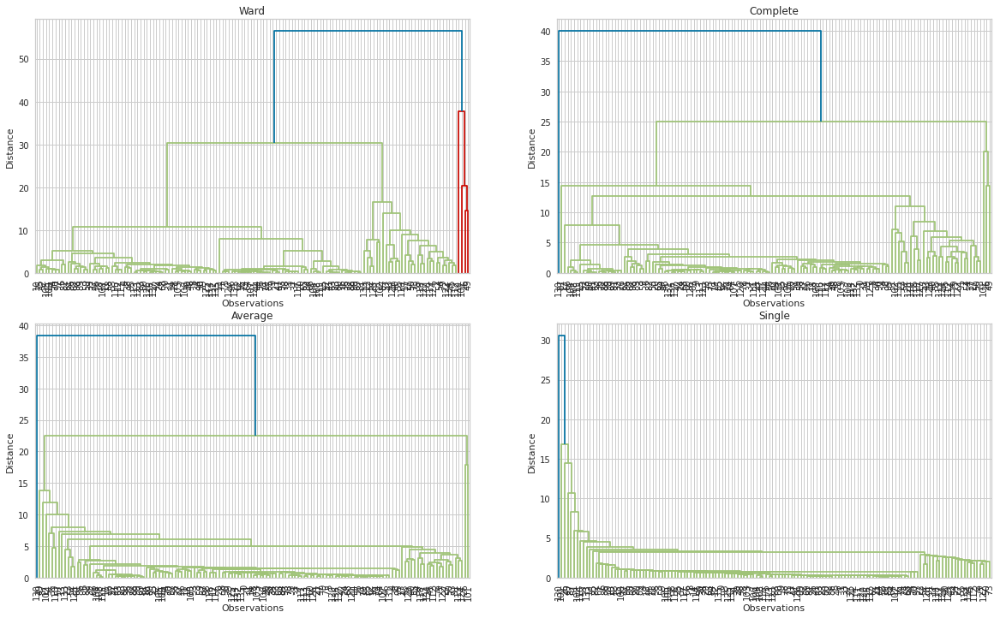

In [129]:
hc_ward = linkage(y = X_scaled, method = "ward")
hc_complete = linkage(X_scaled, "complete")
hc_average = linkage(X_scaled, "average")
hc_single = linkage(X_scaled, "single")

plt.figure(figsize = (20, 12))

plt.subplot(221)
plt.title("Ward")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_ward, leaf_font_size = 10)

plt.subplot(222)
plt.title("Complete")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_complete, leaf_font_size = 10)

plt.subplot(223)
plt.title("Average")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_average, leaf_font_size = 10)

plt.subplot(224)
plt.title("Single")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_single, leaf_font_size = 10);

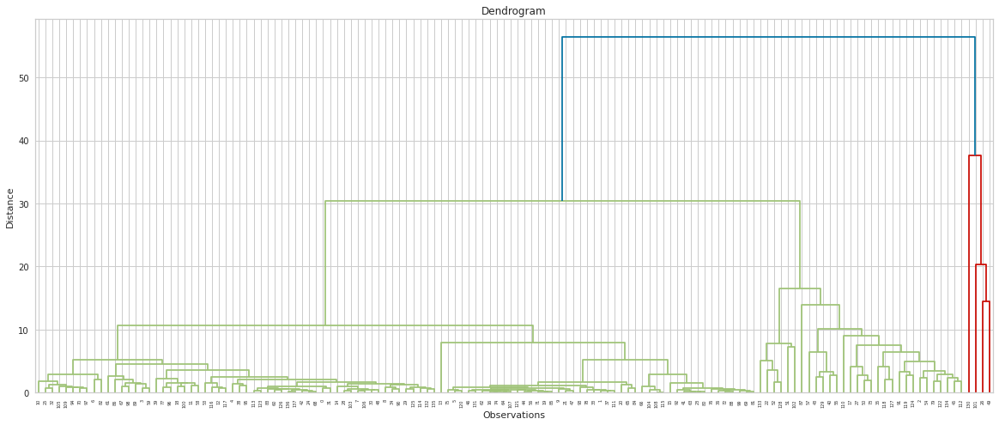

In [130]:
plt.figure(figsize = (20, 8))
plt.title("Dendrogram")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(linkage(X_scaled, method = "ward"), leaf_font_size = 5);

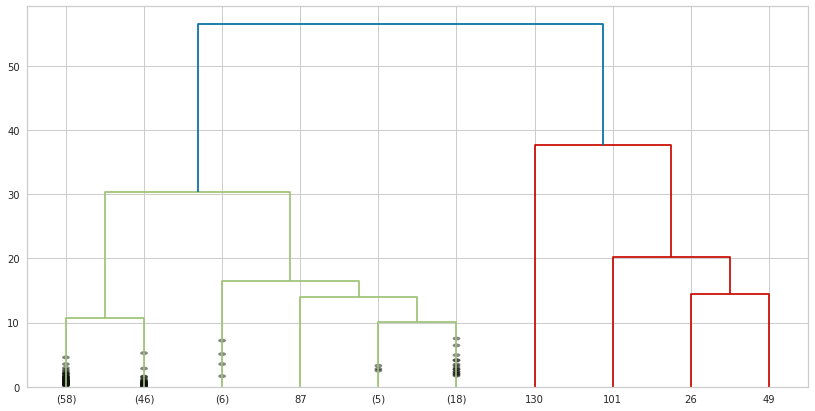

In [131]:
plt.figure(figsize = (14, 7))
dendrogram(hc_ward,
           truncate_mode = "lastp",
           p = 10,
           show_contracted = True,
           leaf_font_size = 10);

<a id="7.2"></a>
#### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">7.2 The Assesment of Silhouette Scores For Hierarchical Cluster Analysis (HCA)</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [132]:
K = range(2, 10)

for k in K:
    HC_model_labels = AgglomerativeClustering(n_clusters = k,  
                                    affinity='euclidean', 
                                    linkage='ward').fit_predict(X_scaled)
    print(f'Silhouette Score for {k} clusters: {silhouette_score(X_scaled, HC_model_labels)}')

Silhouette Score for 2 clusters: 0.8342300950615665
Silhouette Score for 3 clusters: 0.8039883598834141
Silhouette Score for 4 clusters: 0.563316658557273
Silhouette Score for 5 clusters: 0.5634398318976558
Silhouette Score for 6 clusters: 0.5744584656959892
Silhouette Score for 7 clusters: 0.574125142644776
Silhouette Score for 8 clusters: 0.5708249506953352
Silhouette Score for 9 clusters: 0.24856299158839315


<a id="7.3"></a>
#### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">7.3 The Implementation of Hierarchical Cluster Analysis (HCA)</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

### Model Building and label visualisation

In [133]:
HC_model = AgglomerativeClustering(n_clusters = 4,
                                affinity='euclidean',
                                linkage='ward')

In [134]:
HC_clusters = HC_model.fit_predict(X_scaled)
HC_clusters

array([3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3,
       1, 3, 3, 3, 0, 1, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 1, 3, 3, 1,
       3, 1, 3, 3, 3, 0, 1, 1, 1, 3, 1, 1, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 1,
       3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 1, 3, 3, 3, 3, 3, 3, 3,
       1, 3, 1, 3, 3, 3, 3, 3, 1, 1, 3, 3, 1, 3, 1, 3, 3, 1, 1, 1, 2, 3,
       3, 1, 1, 3, 3, 3])

In [135]:
value_df["HC_model_cluster"] = HC_model.labels_

In [136]:
value_df

,country,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,K-Means_cluster,HC_model_cluster
0,Afghanistan,1.344,260.000,0.000,25.000,30.000,0.000,187.000,0.000,0.000,1062.000,0.000,176.000,50.000,0.000,0.000,0.000,0.000,0.000,12000000000.000,2840000000.000,43.000,0.000,5500.000,0.000,14325743.000,34940837.000,0,3
1,Albania,2.314,19.000,0.000,0.000,0.000,0.000,19.000,0.000,0.000,467.000,0.000,0.000,0.000,38.000,0.000,0.000,0.000,0.000,250000000.000,9505000000.000,4.000,16000.000,42500.000,168300000.000,1519438.000,3057220.000,0,3
2,Algeria,0.466,551.000,103.000,22.000,59.000,87.000,257.000,45.000,880.000,7361.000,320.000,240.000,316.000,201.000,0.000,6.000,0.000,5.000,13000000000.000,6260000000.000,157.000,1306000.000,325000.000,12200000000.000,20741263.000,41657488.000,3,1
3,Angola,0.838,295.000,72.000,18.000,30.000,47.000,126.000,15.000,379.000,595.000,28.000,357.000,115.000,57.000,0.000,0.000,0.000,0.000,7000000000.000,42080000000.000,176.000,1666000.000,82300.000,8273000000.000,6244205.000,30355880.000,0,3
4,Argentina,0.652,227.000,24.000,7.000,9.000,64.000,100.000,0.000,370.000,739.000,83.000,172.000,26.000,49.000,0.000,2.000,4.000,0.000,4200000000.000,214900000000.000,1138.000,479400.000,685000.000,2185000000.000,20179430.000,44694198.000,0,3
5,Armenia,2.125,64.000,0.000,9.000,3.000,13.000,37.000,20.000,110.000,748.000,38.000,150.000,68.000,0.000,0.000,0.000,0.000,0.000,1385000000.000,10410000000.000,11.000,0.000,47500.000,0.000,1696085.000,3038217.000,0,3
6,Australia,0.323,464.000,82.000,6.000,38.000,174.000,133.000,22.000,59.000,3051.000,0.000,54.000,0.000,48.000,2.000,6.000,2.000,8.000,26300000000.000,1714000000000.000,480.000,263000.000,1005000.000,1821000000.000,10808002.000,23470145.000,0,3
7,Austria,0.957,120.000,15.000,0.000,11.000,32.000,62.000,0.000,56.000,467.000,33.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,3380000000.000,630800000000.000,52.000,14260.000,215000.000,43000000.000,4017691.000,8793370.000,0,3
8,Azerbaijan,0.946,147.000,17.000,12.000,1.000,29.000,88.000,17.000,570.000,1451.000,187.000,227.000,162.000,31.000,0.000,4.000,0.000,1.000,2805000000.000,17410000000.000,37.000,789300.000,180000.000,7000000000.000,5042346.000,10046516.000,0,3
9,Bahrain,1.855,109.000,17.000,0.000,2.000,37.000,65.000,22.000,180.000,843.000,33.000,26.000,17.000,39.000,0.000,0.000,0.000,1.000,1415000000.000,52150000000.000,4.000,45000.000,55000.000,124600000.000,806505.000,1422659.000,0,3


In [137]:
value_df["HC_model_cluster"].value_counts()

3    104
1     30
0      3
2      1
Name: HC_model_cluster, dtype: int64

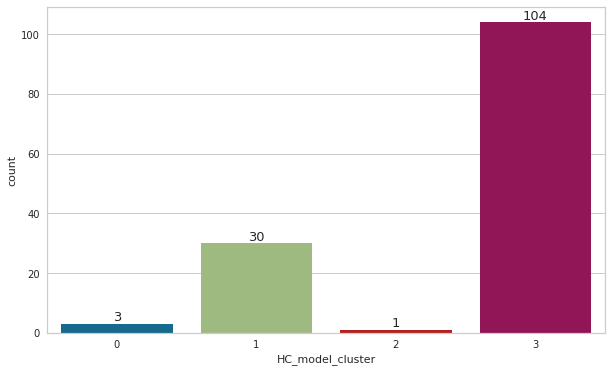

In [138]:
sns.countplot(x=value_df["HC_model_cluster"], data=value_df)

for index, value in enumerate(value_df["HC_model_cluster"].value_counts().sort_index()):
     plt.text(index, value, f"{value}", ha="center", va="bottom", fontsize = 13)

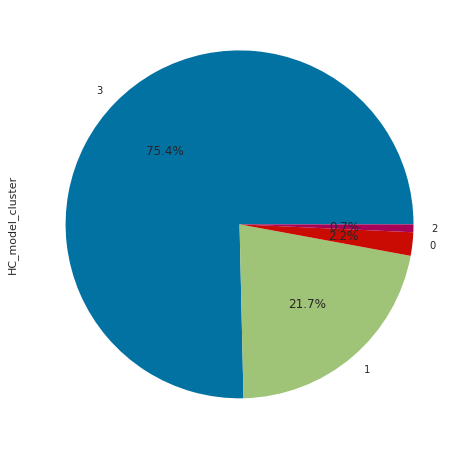

In [139]:
value_df["HC_model_cluster"].value_counts().plot(kind="pie", startangle=0, labeldistance=1.1, autopct='%1.1f%%',figsize=(10, 8));

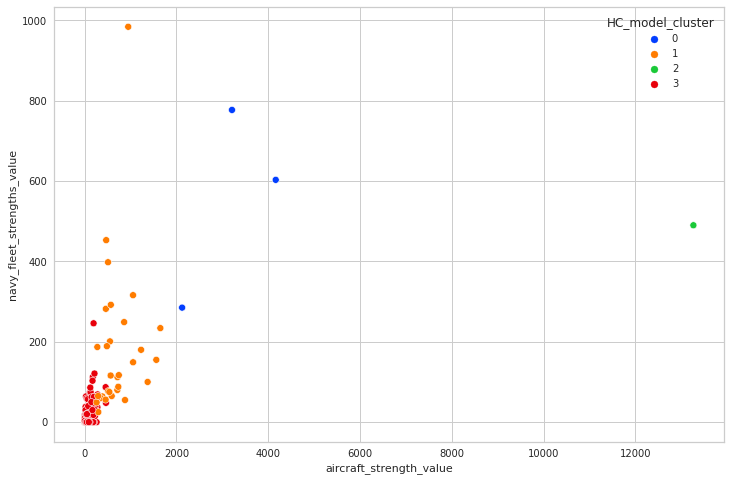

In [140]:
plt.figure(figsize=(12, 8))

sns.scatterplot(value_df["aircraft_strength_value"], 
                value_df["navy_fleet_strengths_value"], hue=value_df["HC_model_cluster"], palette= "bright");

In [141]:
fig = px.scatter_3d(x=value_df["aircraft_strength_value"],
                   y=value_df["defense_spending_budget_value"],
                   z=value_df["external_debt_value"],
                   color=value_df["HC_model_cluster"],
                   labels = {"x": "aircraft_strength_value",
                             "y": "defense_spending_budget_value",
                             "z": "external_debt_value"},
                   hover_name=value_df["country"])

fig.show()

**Let's take a close look at the clusters in which countries are included.**

In [142]:
value_df[value_df["HC_model_cluster"] == 0][["country", "Military Strength Power Index"]].sort_values(by="Military Strength Power Index")

,country,Military Strength Power Index
101,Russia,0.068
26,China,0.069
49,India,0.095


In [143]:
value_df[value_df["HC_model_cluster"] == 1][["country", "Military Strength Power Index"]].sort_values(by="Military Strength Power Index")

,country,Military Strength Power Index
57,Japan,0.150
110,South Korea,0.151
40,France,0.170
129,United Kingdom,0.172
35,Egypt,0.187
17,Brazil,0.199
124,Turkey,0.210
55,Italy,0.211
43,Germany,0.219
51,Iran,0.219


In [144]:
value_df[value_df["HC_model_cluster"] == 2][["country", "Military Strength Power Index"]].sort_values(by="Military Strength Power Index")

,country,Military Strength Power Index
130,United States,0.061


In [145]:
value_df[value_df["HC_model_cluster"] == 3][["country", "Military Strength Power Index"]].sort_values(by="Military Strength Power Index")

,country,Military Strength Power Index
6,Australia,0.323
96,Poland,0.340
109,South Africa,0.498
117,Switzerland,0.526
89,Norway,0.528
116,Sweden,0.530
30,Czechia,0.553
82,Netherlands,0.592
100,Romania,0.618
94,Peru,0.622


<a id="8"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">8 - THE VISUAL COMPARISON & EVALUATION OF MODELS</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [146]:
value_df.head()

,country,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,K-Means_cluster,HC_model_cluster
0,Afghanistan,1.344,260.000,0.000,25.000,30.000,0.000,187.000,0.000,0.000,1062.000,0.000,176.000,50.000,0.000,0.000,0.000,0.000,0.000,12000000000.000,2840000000.000,43.000,0.000,5500.000,0.000,14325743.000,34940837.000,0,3
1,Albania,2.314,19.000,0.000,0.000,0.000,0.000,19.000,0.000,0.000,467.000,0.000,0.000,0.000,38.000,0.000,0.000,0.000,0.000,250000000.000,9505000000.000,4.000,16000.000,42500.000,168300000.000,1519438.000,3057220.000,0,3
2,Algeria,0.466,551.000,103.000,22.000,59.000,87.000,257.000,45.000,880.000,7361.000,320.000,240.000,316.000,201.000,0.000,6.000,0.000,5.000,13000000000.000,6260000000.000,157.000,1306000.000,325000.000,12200000000.000,20741263.000,41657488.000,3,1
3,Angola,0.838,295.000,72.000,18.000,30.000,47.000,126.000,15.000,379.000,595.000,28.000,357.000,115.000,57.000,0.000,0.000,0.000,0.000,7000000000.000,42080000000.000,176.000,1666000.000,82300.000,8273000000.000,6244205.000,30355880.000,0,3
4,Argentina,0.652,227.000,24.000,7.000,9.000,64.000,100.000,0.000,370.000,739.000,83.000,172.000,26.000,49.000,0.000,2.000,4.000,0.000,4200000000.000,214900000000.000,1138.000,479400.000,685000.000,2185000000.000,20179430.000,44694198.000,0,3


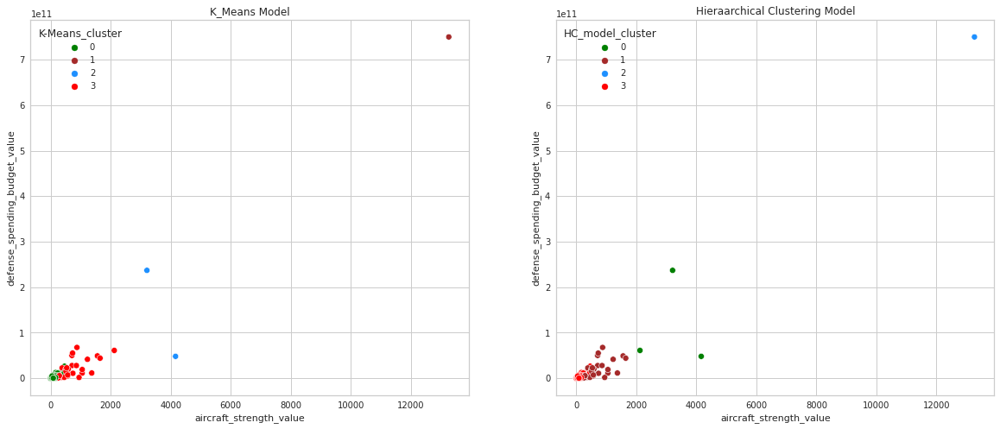

In [147]:
plt.figure(figsize = (20,8))

plt.subplot(121)
sns.scatterplot(x="aircraft_strength_value", y="defense_spending_budget_value", hue='K-Means_cluster', data=value_df, palette=['green', 'brown','dodgerblue','red'])
plt.title("K_Means Model")

plt.subplot(122)
sns.scatterplot(x="aircraft_strength_value", y="defense_spending_budget_value", hue='HC_model_cluster', data=value_df, palette=['green', 'brown','dodgerblue','red'])
plt.title("Hieraarchical Clustering Model");

In [148]:
value_df

,country,Military Strength Power Index,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,K-Means_cluster,HC_model_cluster
0,Afghanistan,1.344,260.000,0.000,25.000,30.000,0.000,187.000,0.000,0.000,1062.000,0.000,176.000,50.000,0.000,0.000,0.000,0.000,0.000,12000000000.000,2840000000.000,43.000,0.000,5500.000,0.000,14325743.000,34940837.000,0,3
1,Albania,2.314,19.000,0.000,0.000,0.000,0.000,19.000,0.000,0.000,467.000,0.000,0.000,0.000,38.000,0.000,0.000,0.000,0.000,250000000.000,9505000000.000,4.000,16000.000,42500.000,168300000.000,1519438.000,3057220.000,0,3
2,Algeria,0.466,551.000,103.000,22.000,59.000,87.000,257.000,45.000,880.000,7361.000,320.000,240.000,316.000,201.000,0.000,6.000,0.000,5.000,13000000000.000,6260000000.000,157.000,1306000.000,325000.000,12200000000.000,20741263.000,41657488.000,3,1
3,Angola,0.838,295.000,72.000,18.000,30.000,47.000,126.000,15.000,379.000,595.000,28.000,357.000,115.000,57.000,0.000,0.000,0.000,0.000,7000000000.000,42080000000.000,176.000,1666000.000,82300.000,8273000000.000,6244205.000,30355880.000,0,3
4,Argentina,0.652,227.000,24.000,7.000,9.000,64.000,100.000,0.000,370.000,739.000,83.000,172.000,26.000,49.000,0.000,2.000,4.000,0.000,4200000000.000,214900000000.000,1138.000,479400.000,685000.000,2185000000.000,20179430.000,44694198.000,0,3
5,Armenia,2.125,64.000,0.000,9.000,3.000,13.000,37.000,20.000,110.000,748.000,38.000,150.000,68.000,0.000,0.000,0.000,0.000,0.000,1385000000.000,10410000000.000,11.000,0.000,47500.000,0.000,1696085.000,3038217.000,0,3
6,Australia,0.323,464.000,82.000,6.000,38.000,174.000,133.000,22.000,59.000,3051.000,0.000,54.000,0.000,48.000,2.000,6.000,2.000,8.000,26300000000.000,1714000000000.000,480.000,263000.000,1005000.000,1821000000.000,10808002.000,23470145.000,0,3
7,Austria,0.957,120.000,15.000,0.000,11.000,32.000,62.000,0.000,56.000,467.000,33.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,3380000000.000,630800000000.000,52.000,14260.000,215000.000,43000000.000,4017691.000,8793370.000,0,3
8,Azerbaijan,0.946,147.000,17.000,12.000,1.000,29.000,88.000,17.000,570.000,1451.000,187.000,227.000,162.000,31.000,0.000,4.000,0.000,1.000,2805000000.000,17410000000.000,37.000,789300.000,180000.000,7000000000.000,5042346.000,10046516.000,0,3
9,Bahrain,1.855,109.000,17.000,0.000,2.000,37.000,65.000,22.000,180.000,843.000,33.000,26.000,17.000,39.000,0.000,0.000,0.000,1.000,1415000000.000,52150000000.000,4.000,45000.000,55000.000,124600000.000,806505.000,1422659.000,0,3


In [149]:
value_df.groupby(["Military Strength Power Index", "country"]).mean()

,,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,K-Means_cluster,HC_model_cluster
Military Strength Power Index,country,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.061,United States,13264.000,2085.000,715.000,945.000,2643.000,5768.000,967.000,6289.000,39253.000,1465.000,2740.000,1366.000,490.000,20.000,66.000,91.000,0.000,750000000000.000,17910000000000.000,13513.000,9352000.000,20000000.000,36520000000.000,144872845.000,329256465.000,1.000,2.000
0.068,Russia,4163.000,873.000,742.000,424.000,497.000,1522.000,531.000,12950.000,27038.000,6083.000,4465.000,3860.000,603.000,1.000,62.000,16.000,10.000,48000000000.000,539600000000.000,1218.000,10580000.000,3225000.000,80000000000.000,69640160.000,142122776.000,2.000,0.000
0.069,China,3210.000,1232.000,371.000,224.000,314.000,911.000,281.000,3500.000,33000.000,3800.000,3600.000,2650.000,777.000,2.000,74.000,36.000,52.000,237000000000.000,1598000000000.000,507.000,3838000.000,13500000.000,25620000000.000,752855402.000,1384688986.000,2.000,0.000
0.095,India,2123.000,538.000,172.000,250.000,359.000,722.000,23.000,4292.000,8686.000,235.000,4060.000,266.000,285.000,1.000,16.000,10.000,13.000,61000000000.000,501600000000.000,346.000,733900.000,5000000.000,4621000000.000,622480340.000,1296834042.000,3.000,0.000
0.150,Japan,1561.000,279.000,12.000,60.000,427.000,637.000,119.000,1004.000,3130.000,238.000,500.000,99.000,155.000,4.000,20.000,40.000,0.000,49000000000.000,3240000000000.000,175.000,3841.000,4000000.000,44120000.000,53873803.000,126168156.000,3.000,1.000
0.151,South Korea,1649.000,414.000,71.000,41.000,298.000,803.000,112.000,2614.000,14000.000,3040.000,3854.000,575.000,234.000,2.000,19.000,12.000,12.000,44000000000.000,384600000000.000,111.000,0.000,2800000.000,0.000,25709049.000,51418097.000,3.000,1.000
0.170,France,1229.000,269.000,0.000,121.000,187.000,589.000,62.000,528.000,6028.000,109.000,12.000,13.000,180.000,4.000,9.000,11.000,11.000,41500000000.000,5360000000000.000,464.000,15170.000,1600000.000,72350000.000,30111868.000,67364357.000,3.000,1.000
0.172,United Kingdom,733.000,133.000,15.000,44.000,241.000,312.000,49.000,227.000,5000.000,89.000,126.000,35.000,88.000,2.000,10.000,6.000,13.000,55100000000.000,8126000000000.000,460.000,910500.000,1600000.000,2564000000.000,29948413.000,65105246.000,3.000,1.000
0.187,Egypt,1054.000,215.000,88.000,59.000,387.000,294.000,81.000,4295.000,11700.000,1139.000,2189.000,1084.000,316.000,2.000,8.000,0.000,7.000,11200000000.000,77470000000.000,83.000,589400.000,832000.000,4400000000.000,42946553.000,99413317.000,3.000,1.000


In [150]:
value_df["K-Means_cluster"].value_counts()

0    104
3     31
2      2
1      1
Name: K-Means_cluster, dtype: int64

In [151]:
value_df["HC_model_cluster"].value_counts()

3    104
1     30
0      3
2      1
Name: HC_model_cluster, dtype: int64

In [152]:
value_df["K-Means_Classification"] = value_df["K-Means_cluster"].map({  2 : "Powerfull Army",
                                                            3 : "Medium Power Army",
                                                            1 : "The Most Powerfull Army",
                                                            0 : "Weak Army",
                                                         })

In [153]:
value_df["HC_model_Classification"] = value_df["HC_model_cluster"].map({  0 : "Powerfull Army",
                                                            1 : "Medium Power Army",
                                                            2 : "The Most Powerfull Army",
                                                            3 : "Weak Army",
                                                         })

In [154]:
value_df[["country", 
          'Military Strength Power Index', 
          'K-Means_cluster', 
          'K-Means_Classification', 
          'HC_model_cluster', 
          'HC_model_Classification']]

,country,Military Strength Power Index,K-Means_cluster,K-Means_Classification,HC_model_cluster,HC_model_Classification
0,Afghanistan,1.344,0,Weak Army,3,Weak Army
1,Albania,2.314,0,Weak Army,3,Weak Army
2,Algeria,0.466,3,Medium Power Army,1,Medium Power Army
3,Angola,0.838,0,Weak Army,3,Weak Army
4,Argentina,0.652,0,Weak Army,3,Weak Army
5,Armenia,2.125,0,Weak Army,3,Weak Army
6,Australia,0.323,0,Weak Army,3,Weak Army
7,Austria,0.957,0,Weak Army,3,Weak Army
8,Azerbaijan,0.946,0,Weak Army,3,Weak Army
9,Bahrain,1.855,0,Weak Army,3,Weak Army


In [155]:
value_df.groupby(["Military Strength Power Index", "country"]).mean().head(20)

,,aircraft_strength_value,fighter/interceptor_strength_value,attack_aircraft_strength_value,transport_aircraft_fleet_strength_value,trainer_aircraft_fleet_value,helicopter_fleet_strength_value,attack_helicopter_fleet_strength_value,tank_strength_value,afv/apc_strength_value,self-propelled_artillery_strength_value,towed_artillery_strength_value,rocket_projector_strength_value,navy_fleet_strengths_value,aircraft_carrier_fleet_strength_value,submarine_fleet_strength_value,destroyer_fleet_strength_value,frigate_fleet_strength_value,defense_spending_budget_value,external_debt_value,airport_totals_value,oil_production_value,oil_consumption_value,proven_oil_reserves_value,available_manpower_value,total_population_value,K-Means_cluster,HC_model_cluster
Military Strength Power Index,country,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.061,United States,13264.000,2085.000,715.000,945.000,2643.000,5768.000,967.000,6289.000,39253.000,1465.000,2740.000,1366.000,490.000,20.000,66.000,91.000,0.000,750000000000.000,17910000000000.000,13513.000,9352000.000,20000000.000,36520000000.000,144872845.000,329256465.000,1.000,2.000
0.068,Russia,4163.000,873.000,742.000,424.000,497.000,1522.000,531.000,12950.000,27038.000,6083.000,4465.000,3860.000,603.000,1.000,62.000,16.000,10.000,48000000000.000,539600000000.000,1218.000,10580000.000,3225000.000,80000000000.000,69640160.000,142122776.000,2.000,0.000
0.069,China,3210.000,1232.000,371.000,224.000,314.000,911.000,281.000,3500.000,33000.000,3800.000,3600.000,2650.000,777.000,2.000,74.000,36.000,52.000,237000000000.000,1598000000000.000,507.000,3838000.000,13500000.000,25620000000.000,752855402.000,1384688986.000,2.000,0.000
0.095,India,2123.000,538.000,172.000,250.000,359.000,722.000,23.000,4292.000,8686.000,235.000,4060.000,266.000,285.000,1.000,16.000,10.000,13.000,61000000000.000,501600000000.000,346.000,733900.000,5000000.000,4621000000.000,622480340.000,1296834042.000,3.000,0.000
0.150,Japan,1561.000,279.000,12.000,60.000,427.000,637.000,119.000,1004.000,3130.000,238.000,500.000,99.000,155.000,4.000,20.000,40.000,0.000,49000000000.000,3240000000000.000,175.000,3841.000,4000000.000,44120000.000,53873803.000,126168156.000,3.000,1.000
0.151,South Korea,1649.000,414.000,71.000,41.000,298.000,803.000,112.000,2614.000,14000.000,3040.000,3854.000,575.000,234.000,2.000,19.000,12.000,12.000,44000000000.000,384600000000.000,111.000,0.000,2800000.000,0.000,25709049.000,51418097.000,3.000,1.000
0.170,France,1229.000,269.000,0.000,121.000,187.000,589.000,62.000,528.000,6028.000,109.000,12.000,13.000,180.000,4.000,9.000,11.000,11.000,41500000000.000,5360000000000.000,464.000,15170.000,1600000.000,72350000.000,30111868.000,67364357.000,3.000,1.000
0.172,United Kingdom,733.000,133.000,15.000,44.000,241.000,312.000,49.000,227.000,5000.000,89.000,126.000,35.000,88.000,2.000,10.000,6.000,13.000,55100000000.000,8126000000000.000,460.000,910500.000,1600000.000,2564000000.000,29948413.000,65105246.000,3.000,1.000
0.187,Egypt,1054.000,215.000,88.000,59.000,387.000,294.000,81.000,4295.000,11700.000,1139.000,2189.000,1084.000,316.000,2.000,8.000,0.000,7.000,11200000000.000,77470000000.000,83.000,589400.000,832000.000,4400000000.000,42946553.000,99413317.000,3.000,1.000


In [156]:
value_df[value_df["HC_model_cluster"] == 0][["country", "Military Strength Power Index"]].sort_values(by="Military Strength Power Index")

,country,Military Strength Power Index
101,Russia,0.068
26,China,0.069
49,India,0.095


<a id="9"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">9 - CONCLUSION</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Both models obtained by K-Means and HCA in our analysis revealed that in the list of the most powerful armies of the world, the first name is that of the United States which has the most modern and strong military power.**

**The United States is perceived to be the most powerful country again, and has the world’s largest economy and biggest military budget, spending over $750 billion on military hardware and personnel in 2020.**

**Russia overtakes China and India to be seen as the second-most powerful country. For 2020, China is ranked 3 out of 138 countries holding a PwrIndx rating of 0.069 while India comes 4th in the list holding a PwrIndx rating of 0.095. However, all these three (3) countries are in the same cluster and among the world’s top military spenders. Following the top four (4) are Japan, South Korea, France and the U.K. are countries that have given out large amounts of military spending. France and the U.K took at 7th and 8th places with PwrIndx ratings of 0.170 and 0.172, respectively. Japan is ranked 5th out of 138 countries holding a PwrIndx rating of 0.150. Most probably the country continues to look to the future and viable solutions to growing regional problems – namely the threat from North Korea. South Korea is ranked 6th out of 138 countries holding a PwrIndx rating of 0.151. Similarly, under the ever-present threat of its unpredictable northern neighbor, South Korea manages a large and powerful military force. Egypt, Brazil and Turkey suprisingly overtakes Italy and Germany which are included in No. 8, 9, 10, 11 and 12 respectively.**

**Countries perceived to be less powerful tended to be smaller nations with medium to small economies. Bhutan, a small country in South Asia, is viewed as the least powerful nation, followed by Liberia, another small country in Afrika. Sierra Leone, Suriname and Somalia round out the bottom five.**

<a id="10"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">10 - REFERENCES</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

- Kline, R.B. (2011). Principles and practice of structural equation modeling (5th ed., pp. 3-427). New York:The Guilford Press.
- Edwards, A. (1976). An introduction to linear regression and correlation. W. H. Freeman
- Everitt, B. S.; Skrondal, A. (2010), The Cambridge Dictionary of Statistics, Cambridge University Press.
- https://www.amazon.com/Python-Feature-Engineering-Cookbook-transforming/dp/1789806313/ref=sr_1_1?dchild=1&keywords=feature+engineering+cookbook&qid=1627628487&s=books&sr=1-1
- https://www.amazon.com/Feature-Engineering-Made-Easy-Identify-ebook/dp/B077N6MK5W
- https://www.amazon.com/Feature-Engineering-Selection-Chapman-Science/dp/1032090855/ref=sr_1_1?crid=19T9G95E1W7VJ&dchild=1&keywords=feature+engineering+and+selection+kuhn&qid=1628050948&sprefix=feature+engineering+and+%2Cdigital-text%2C293&sr=8-1
- https://www.amazon.com/Introduction-Machine-Learning-Python-Scientists/dp/1449369413
- Neural Networks from Scratch in Python (by Kinsley § Kukiela) [external link text](https://nnfs.io/)
- Practical Statistics for Data Scientists (by Bruce & Gedeck) [external link text](https://www.amazon.com/Practical-Statistics-Data-Scientists-Essential/dp/149207294X/ref=sr_1_1?dchild=1&keywords=Practical+Statistics+for+Data+Scientists&qid=1627662007&sr=8-1)
- Applications of Deep Neural Networks(by Jeff Heaton) [external link text](https://arxiv.org/abs/2009.05673)
- Applied Predictive Modeling (by Kuhn & Johnson) [external link text](https://www.amazon.com/Applied-Predictive-Modeling-Max-Kuhn/dp/1461468485/ref=pd_sbs_3/141-4288971-3747365?pd_rd_w=AOIS7&pf_rd_p=3676f086-9496-4fd7-8490-77cf7f43f846&pf_rd_r=MCCHJXWK39VD6VW7RVAR&pd_rd_r=4ffcd1ea-44b9-4f33-b9b3-dc02ee159662&pd_rd_wg=nU1Ex&pd_rd_i=1461468485&psc=1:)
- Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow (by Aurélien Géron) [external link text](https://www.amazon.com/Hands-Machine-Learning-Scikit-Learn-TensorFlow/dp/1492032646/ref=sr_1_1?crid=2GV554Q2EKD1E&dchild=1&keywords=hands-on+machine+learning+with+scikit-learn%2C+keras%2C+and+tensorflow&qid=1627628294&s=books&sprefix=hands%2Cstripbooks-intl-ship%2C309&sr=1-1)
- Master Machine Learning Algorithms (by Brownlee, ML algorithms are very well explained ) [external link text](https://machinelearningmastery.com/master-machine-learning-algorithms/)
- Python Feature Engineering Cookbook (by Galli) [external link text](https://www.amazon.com/Python-Feature-Engineering-Cookbook-transforming/dp/1789806313/ref=sr_1_1?dchild=1&keywords=feature+engineering+cookbook&qid=1627628487&s=books&sr=1-1)
- Feature Engineering Made Easy (by Ozdemir & Susarla) [external link text](https://www.amazon.com/Feature-Engineering-Made-Easy-Identify-ebook/dp/B077N6MK5W)
- Feature Engineering and Selection (by Kuhn & Johnson) [external link text](https://www.amazon.com/Feature-Engineering-Selection-Chapman-Science/dp/1032090855/ref=sr_1_1?crid=19T9G95E1W7VJ&dchild=1&keywords=feature+engineering+and+selection+kuhn&qid=1628050948&sprefix=feature+engineering+and+%2Cdigital-text%2C293&sr=8-1)
- Imbalanced Classification with Python(by Brownlee) [external link text](https://machinelearningmastery.com/imbalanced-classification-with-python/)
- https://analyticsindiamag.com/why-data-scaling-is-important-in-machine-learning-how-to-effectively-do-it/
- https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/
- https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/
- https://www.kaggle.com/kadirduran/military-power-clustering

<a id="11"></a>
## <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">11 - FURTHER READINGS</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

- Kline, R.B. (2011). Principles and practice of structural equation modeling (5th ed., pp. 3-427). New York:The Guilford Press.
- Edwards, A. (1976). An introduction to linear regression and correlation. W. H. Freeman
- Everitt, B. S.; Skrondal, A. (2010), The Cambridge Dictionary of Statistics, Cambridge University Press.
- https://www.amazon.com/Python-Feature-Engineering-Cookbook-transforming/dp/1789806313/ref=sr_1_1?dchild=1&keywords=feature+engineering+cookbook&qid=1627628487&s=books&sr=1-1
- https://www.amazon.com/Feature-Engineering-Made-Easy-Identify-ebook/dp/B077N6MK5W
- https://www.amazon.com/Feature-Engineering-Selection-Chapman-Science/dp/1032090855/ref=sr_1_1?crid=19T9G95E1W7VJ&dchild=1&keywords=feature+engineering+and+selection+kuhn&qid=1628050948&sprefix=feature+engineering+and+%2Cdigital-text%2C293&sr=8-1
- https://www.amazon.com/Introduction-Machine-Learning-Python-Scientists/dp/1449369413
- Neural Networks from Scratch in Python (by Kinsley § Kukiela) [external link text](https://nnfs.io/)
- Practical Statistics for Data Scientists (by Bruce & Gedeck) [external link text](https://www.amazon.com/Practical-Statistics-Data-Scientists-Essential/dp/149207294X/ref=sr_1_1?dchild=1&keywords=Practical+Statistics+for+Data+Scientists&qid=1627662007&sr=8-1)
- Applications of Deep Neural Networks(by Jeff Heaton) [external link text](https://arxiv.org/abs/2009.05673)
- Applied Predictive Modeling (by Kuhn & Johnson) [external link text](https://www.amazon.com/Applied-Predictive-Modeling-Max-Kuhn/dp/1461468485/ref=pd_sbs_3/141-4288971-3747365?pd_rd_w=AOIS7&pf_rd_p=3676f086-9496-4fd7-8490-77cf7f43f846&pf_rd_r=MCCHJXWK39VD6VW7RVAR&pd_rd_r=4ffcd1ea-44b9-4f33-b9b3-dc02ee159662&pd_rd_wg=nU1Ex&pd_rd_i=1461468485&psc=1:)
- Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow (by Aurélien Géron) [external link text](https://www.amazon.com/Hands-Machine-Learning-Scikit-Learn-TensorFlow/dp/1492032646/ref=sr_1_1?crid=2GV554Q2EKD1E&dchild=1&keywords=hands-on+machine+learning+with+scikit-learn%2C+keras%2C+and+tensorflow&qid=1627628294&s=books&sprefix=hands%2Cstripbooks-intl-ship%2C309&sr=1-1)
- Master Machine Learning Algorithms (by Brownlee, ML algorithms are very well explained ) [external link text](https://machinelearningmastery.com/master-machine-learning-algorithms/)
- Python Feature Engineering Cookbook (by Galli) [external link text](https://www.amazon.com/Python-Feature-Engineering-Cookbook-transforming/dp/1789806313/ref=sr_1_1?dchild=1&keywords=feature+engineering+cookbook&qid=1627628487&s=books&sr=1-1)
- Feature Engineering Made Easy (by Ozdemir & Susarla) [external link text](https://www.amazon.com/Feature-Engineering-Made-Easy-Identify-ebook/dp/B077N6MK5W)
- Feature Engineering and Selection (by Kuhn & Johnson) [external link text](https://www.amazon.com/Feature-Engineering-Selection-Chapman-Science/dp/1032090855/ref=sr_1_1?crid=19T9G95E1W7VJ&dchild=1&keywords=feature+engineering+and+selection+kuhn&qid=1628050948&sprefix=feature+engineering+and+%2Cdigital-text%2C293&sr=8-1)
- Imbalanced Classification with Python(by Brownlee) [external link text](https://machinelearningmastery.com/imbalanced-classification-with-python/)

# Have fun while... 👋